In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json
from IPython.display import display, Markdown
from scipy.stats import pearsonr, spearmanr, ks_2samp, mannwhitneyu, ttest_ind

import sys
sys.path.append('../')

import utils
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## directory where results are
EXPERIMENT_DIR = f"/data/bodyct/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst"

TEAMS_DIR = "C:/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
NLST_PREDS = TEAMS_DIR ## Comment out if not using Teams backup (aka Chansey is up :)

## Load predictions

In [2]:
nlst_preds_nodule = pd.read_csv(f"{NLST_PREDS}/nlst_demov4_allmodels_cal.csv")
nlst_preds_nodule.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Columns: 122 entries, PatientID to Solid
dtypes: bool(25), float64(83), int64(11), object(3)
memory usage: 12.3+ MB


In [3]:
with open(f'{NLST_PREDS}/nlst_demo_v4_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [4]:
nlst_preds = utils.prep_nlst_preds(nlst_preds_nodule, scanlevel=True, tijmen=True, sybil=True)
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1172 entries, 4740 to 10150
Columns: 117 entries, PatientID to Solid
dtypes: bool(25), float64(80), int64(11), object(1)
memory usage: 880.1+ KB


In [5]:
MODEL_TO_COL = {
    "Venkadesh": "DL_cal",
    "de Haas Combined": "Thijmen_mean_cal",
    # "de Haas Local": "Thijmen_local_cal",
    # "de Haas Global (hidden nodule)": "Thijmen_global_hidden",
    # "de Haas Global (w/nodule)": "Thijmen_global_show_cal",
    "Sybil": "sybil_year1",
    "PanCan2b": "PanCan2b",
}

## Pick threshold policies

In [6]:
THRESHOLD = utils.ILST_THRESHOLD
THRESHOLD

0.06

### Venkadesh

,Sensitivity,Specificity,Youden J
0.0,1.000000,0.000000,0.000000
0.1,0.771654,0.764593,0.536247
0.2,0.629921,0.875598,0.505519
0.3,0.480315,0.933971,0.414286
0.4,0.362205,0.963636,0.325841
0.5,0.275591,0.987560,0.263150
0.6,0.212598,0.994258,0.206857
0.7,0.141732,0.998086,0.139818
0.8,0.070866,0.999043,0.069909
0.9,0.023622,1.000000,0.023622


Peak Youden's J statistic (TPR - FPR): 0.5669215989149681


,Sensitivity,Specificity,Youden J
0.076,0.84252,0.724402,0.566922


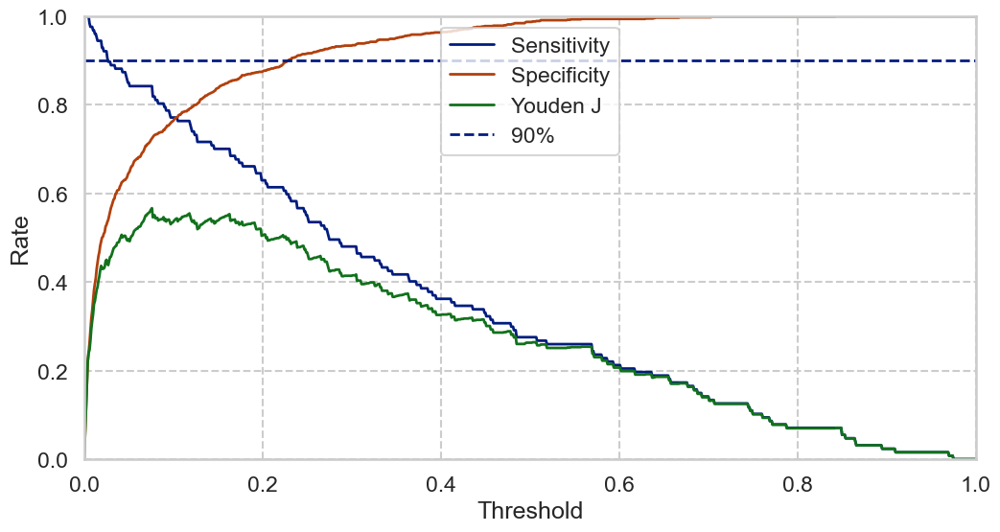

### de Haas Combined

,Sensitivity,Specificity,Youden J
0.0,1.000000,0.000000,0.000000
0.1,0.850394,0.714833,0.565226
0.2,0.700787,0.847847,0.548634
0.3,0.559055,0.918660,0.477715
0.4,0.456693,0.950239,0.406932
0.5,0.370079,0.974163,0.344241
0.6,0.244094,0.983732,0.227827
0.7,0.149606,0.991388,0.140994
0.8,0.062992,0.997129,0.060121
0.9,0.000000,0.999043,-0.000957


Peak Youden's J statistic (TPR - FPR): 0.576875259013676


,Sensitivity,Specificity,Youden J
0.144,0.787402,0.789474,0.576875


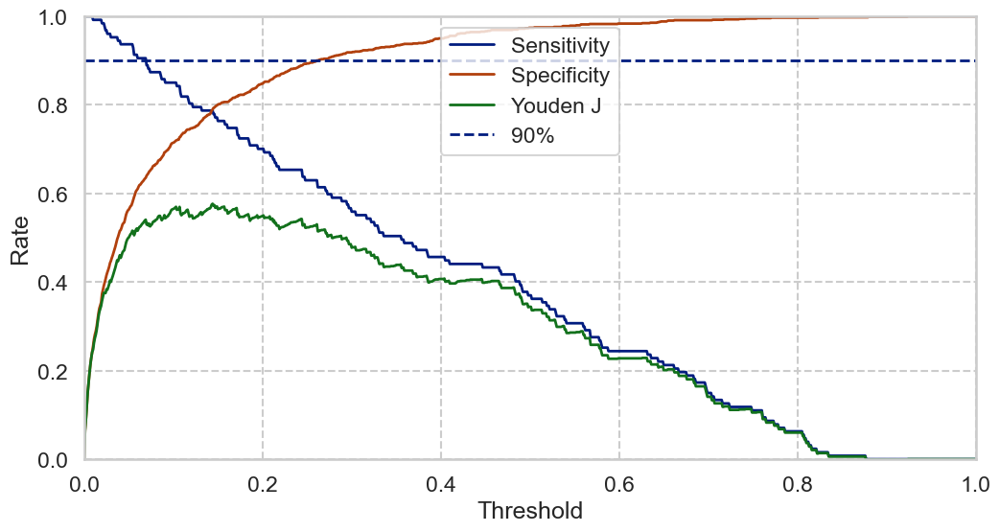

### Sybil

,Sensitivity,Specificity,Youden J
0.0,0.984252,0.107177,0.091429
0.1,0.535433,0.922488,0.457921
0.2,0.299213,0.980861,0.280074
0.3,0.165354,0.992344,0.157699
0.4,0.118110,0.998086,0.116196
0.5,0.031496,1.000000,0.031496
0.6,0.031496,1.000000,0.031496
0.7,0.031496,1.000000,0.031496
0.8,0.031496,1.000000,0.031496
0.9,0.000000,1.000000,0.000000


Peak Youden's J statistic (TPR - FPR): 0.5439023471348378


,Sensitivity,Specificity,Youden J
0.017,0.771654,0.772249,0.543902


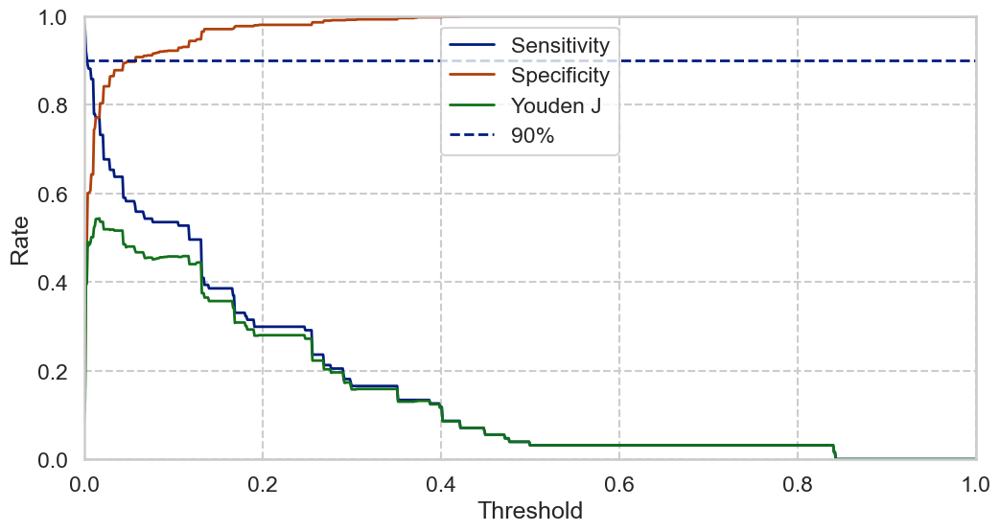

### PanCan2b

,Sensitivity,Specificity,Youden J
0.0,1.000000,0.023923,0.023923
0.1,0.503937,0.811483,0.315420
0.2,0.267717,0.926316,0.194032
0.3,0.173228,0.968421,0.141649
0.4,0.094488,0.982775,0.077263
0.5,0.055118,0.993301,0.048420
0.6,0.023622,0.998086,0.021708
0.7,0.015748,0.999043,0.014791
0.8,0.007874,1.000000,0.007874
0.9,0.000000,1.000000,0.000000


Peak Youden's J statistic (TPR - FPR): 0.3915307237313039


,Sensitivity,Specificity,Youden J
0.038,0.76378,0.627751,0.391531


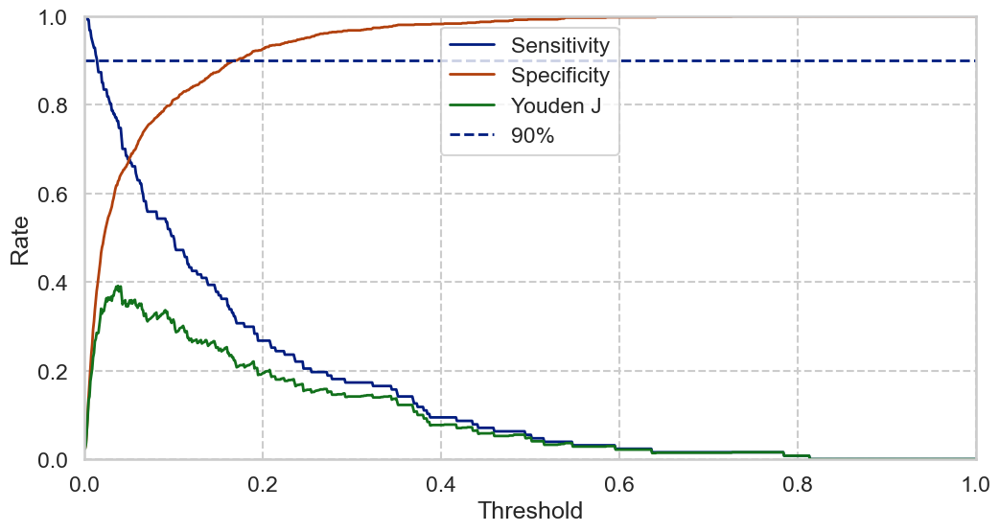

In [7]:
DATASET_NAME = 'NLST'
N = len(nlst_preds)

threshold_info = {}
threshold_precision = 3
threshold_cands = np.arange(0, 1, 10**(-1 * threshold_precision))

true_col = nlst_preds['label']
for m in MODEL_TO_COL:
    pred_col = nlst_preds[MODEL_TO_COL[m]]
    stats = {}
    for t in threshold_cands:
        stats[np.around(t, threshold_precision)] = utils.stats_from_cm(*utils.cm_with_thres(nlst_preds, threshold=t, pred_col=MODEL_TO_COL[m], true_col='label'))
    
    statdf = pd.DataFrame(stats).T
    statdf['Sensitivity'] = statdf['tpr']
    statdf['Specificity'] = statdf['tnr']
    statdf['Youden J'] = statdf['j']

    threshold_info[m] = statdf[['Sensitivity', 'Specificity', 'Youden J']]
    display(Markdown(f"### {m}"))
    display(statdf.loc[[0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9],['Sensitivity', 'Specificity', 'Youden J']])

    fig = plt.figure(figsize=(12, 6))
    for c in ['Sensitivity', 'Specificity', 'Youden J']:
        plt.plot(threshold_cands, threshold_info[m][c], label=c)

    max_j = threshold_info[m]['Youden J'].max()
    print("Peak Youden's J statistic (TPR - FPR):", max_j)
    display(threshold_info[m][threshold_info[m]['Youden J'] == max_j])
    
    plt.axhline(y=0.9, linestyle='--', label='90%')
    plt.legend(loc='upper center')
    plt.xlabel('Threshold')
    plt.ylabel('Rate')
    plt.xlim(0,1)
    plt.ylim(0,1)
    plt.show()

Find 90% sensitivity and specificity thresholds for each model.

In [8]:
policies = (
    ('Sensitivity', 0.9),
    # ('Sensitivity', 1.0),
    ('Specificity', 0.9),
    # ('Specificity', 1.0),  
    ('Youden J', 1.0) ## Max J statistic
)
policy_thresholds = {}

for col, val in policies:
    display(Markdown(f"### {col} = {val}"))
    other_col = 'Specificity' if col == 'Sensitivity' else 'Sensitivity'
    policy_thresholds[f'{col}={val}'] = {}

    for m in MODEL_TO_COL:
        display(Markdown(f"#### {m}"))
        # sorted_df = threshold_info[m].iloc[(threshold_info[m][col]-val).abs().argsort()]
        df = threshold_info[m]
        df[f"abs_diff"] = abs(df[col] - val)
        df = df.sort_values(by=['abs_diff', other_col], ascending=[True, False])
        df = df.drop(columns=['abs_diff'])
        display(df.head(1))

        policy_thresholds[f'{col}={val}'][m] = list(df.index.values)[0]

policy_threshold_df = pd.DataFrame(policy_thresholds)
policy_threshold_df['Brock'] = [utils.ILST_THRESHOLD] * len(policy_threshold_df)
display(policy_threshold_df)

### Sensitivity = 0.9

#### Venkadesh

,Sensitivity,Specificity,Youden J
0.029,0.897638,0.558852,0.456489


#### de Haas Combined

,Sensitivity,Specificity,Youden J
0.069,0.905512,0.635407,0.540919


#### Sybil

,Sensitivity,Specificity,Youden J
0.003,0.905512,0.491866,0.397378


#### PanCan2b

C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\3054855749.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f"abs_diff"] = abs(df[col] - val)


,Sensitivity,Specificity,Youden J
0.014,0.905512,0.379904,0.285416


### Specificity = 0.9

#### Venkadesh

,Sensitivity,Specificity,Youden J
0.228,0.598425,0.899522,0.497947


#### de Haas Combined

,Sensitivity,Specificity,Youden J
0.261,0.629921,0.900478,0.5304


#### Sybil

,Sensitivity,Specificity,Youden J
0.048,0.582677,0.897608,0.480285


#### PanCan2b

C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\3054855749.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f"abs_diff"] = abs(df[col] - val)


,Sensitivity,Specificity,Youden J
0.166,0.330709,0.899522,0.23023


### Youden J = 1.0

#### Venkadesh

,Sensitivity,Specificity,Youden J
0.076,0.84252,0.724402,0.566922


#### de Haas Combined

,Sensitivity,Specificity,Youden J
0.144,0.787402,0.789474,0.576875


#### Sybil

,Sensitivity,Specificity,Youden J
0.017,0.771654,0.772249,0.543902


#### PanCan2b

C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\3054855749.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f"abs_diff"] = abs(df[col] - val)


,Sensitivity,Specificity,Youden J
0.038,0.76378,0.627751,0.391531


,Sensitivity=0.9,Specificity=0.9,Youden J=1.0,Brock
Venkadesh,0.029,0.228,0.076,0.06
de Haas Combined,0.069,0.261,0.144,0.06
Sybil,0.003,0.048,0.017,0.06
PanCan2b,0.014,0.166,0.038,0.06


## Plot results by category

In [30]:
def modelstats_by_cat(df, cat, threshold_df=policy_threshold_df, threshold_policy='Brock', models=MODEL_TO_COL):
    groups = df.groupby(cat)
    df_catinfo, skips = utils.info_by_splits(groups, min_mal=10)
    if (len(df_catinfo) - len(skips)) < 2:
        return df_catinfo, None
    
    perfs = {}
    for m in models:
        stats, vals = [], []
        vals.append('ALL')
        stats.append(
            utils.stats_from_cm(
                *utils.cm_with_thres(
                    df,
                    threshold=threshold_df.loc[m, threshold_policy],
                    pred_col=models[m],
                    true_col='label',
                )
            )
        )

        for val, df_group in groups:
            if val not in skips:
                vals.append(val)
                stats.append(
                    utils.stats_from_cm(
                        *utils.cm_with_thres(
                            df_group,
                            threshold=policy_threshold_df.loc[m, threshold_policy],
                            pred_col=models[m],
                            true_col='label',
                        )
                    )
                )

        perfs[m] = pd.DataFrame(stats, index=vals)
        perfs[m]['model'] = [m] * len(perfs[m])
    
    return df_catinfo, perfs

In [33]:
def plot_by_category(df, c, threshold_df=policy_threshold_df, diff=True): ## mode can be diff for differences from all
    display(Markdown(f"### {c}"))
    df_catinfo, temp_perfs = modelstats_by_cat(df, c, threshold_df=threshold_df, threshold_policy='Brock')
    display(df_catinfo)

    if temp_perfs is None:
        print("Not enough malignant samples from multiple groups. SKIP")
        return

    metrics_to_plot = ['fpr', 'fnr', 'j']
    fig, ax = plt.subplots(len(policy_threshold_df.columns), len(metrics_to_plot), 
                           figsize=(4 * (len(df_catinfo) + (0 if diff else 1)) * len(metrics_to_plot), 1 + len(policy_threshold_df.columns) * 5),
                           sharex=False, sharey=True)

    for j, policy in enumerate(list(policy_threshold_df.columns)):
        _, perfs = modelstats_by_cat(df, c, threshold_df=threshold_df, threshold_policy=policy)
        first_df = list(perfs.values())[0]
        
        for i, metric in enumerate(metrics_to_plot):
            category = list(first_df.index.values)
            
            if diff:
                category.remove('ALL')
                perf_metrics = {m: list(perfs[m][metric] - perfs[m].loc['ALL', metric])[1:] for m in perfs}
            else:
                perf_metrics = {m: list(perfs[m][metric]) for m in perfs}
            
            
            x = np.arange(len(category))  # the label locations
            width = 0.15  # the width of the bars
            multiplier = 0

            for attribute, measurement in perf_metrics.items():
                offset = (width) * ((multiplier))
                rects = ax[j][i].bar(x + offset, measurement, width, label=attribute)
                ax[j][i].bar_label(rects, padding=3, fmt='%.2f', fontsize='x-small')
                multiplier += 1

            # Add some text for labels, title and custom x-axis tick labels, etc.
            ax[j][i].set_ylabel(metric)
            ax[j][i].set_title(f'{DATASET_NAME} (n={len(df)}) {metric} by {c} (thresholds: {policy})')
            ax[j][i].set_xticks(x + width, [f"{val}\n({first_df.loc[val, 'mal']} mal, {first_df.loc[val, 'ben']} ben)" for val in category])
            # ax[j][i].set_xticks(x + width, category)
            # ax[j][i].legend(loc='upper left', bbox_to_anchor=(1, 1))
                        
            if diff:
                ax[j][i].set_ylim(-0.5,0.5)
            else:
                ax[j][i].set_ylim(0, 1)
            
    handles, labels = ax[0][0].get_legend_handles_labels()
    fig.suptitle(" ")
    fig.legend(handles, labels, loc='upper center', ncol=len(handles))
    plt.tight_layout()
    plt.show()

### Included columns (from predictions)

### wrknomask

,num,pct,num_mal,pct_mal
False,872,74.40273,102,11.697248
True,300,25.59727,25,8.333333


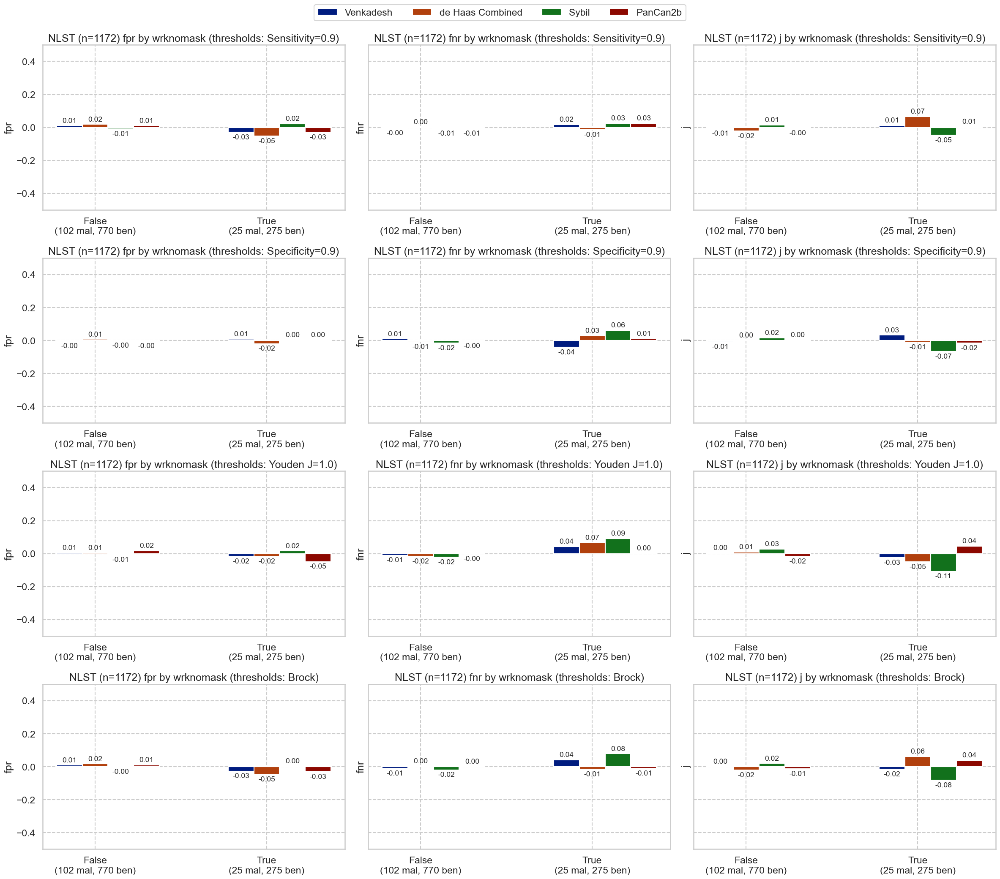

### FamilyHistoryLungCa

,num,pct,num_mal,pct_mal
False,870,74.232082,87,10.000000
True,302,25.767918,40,13.245033


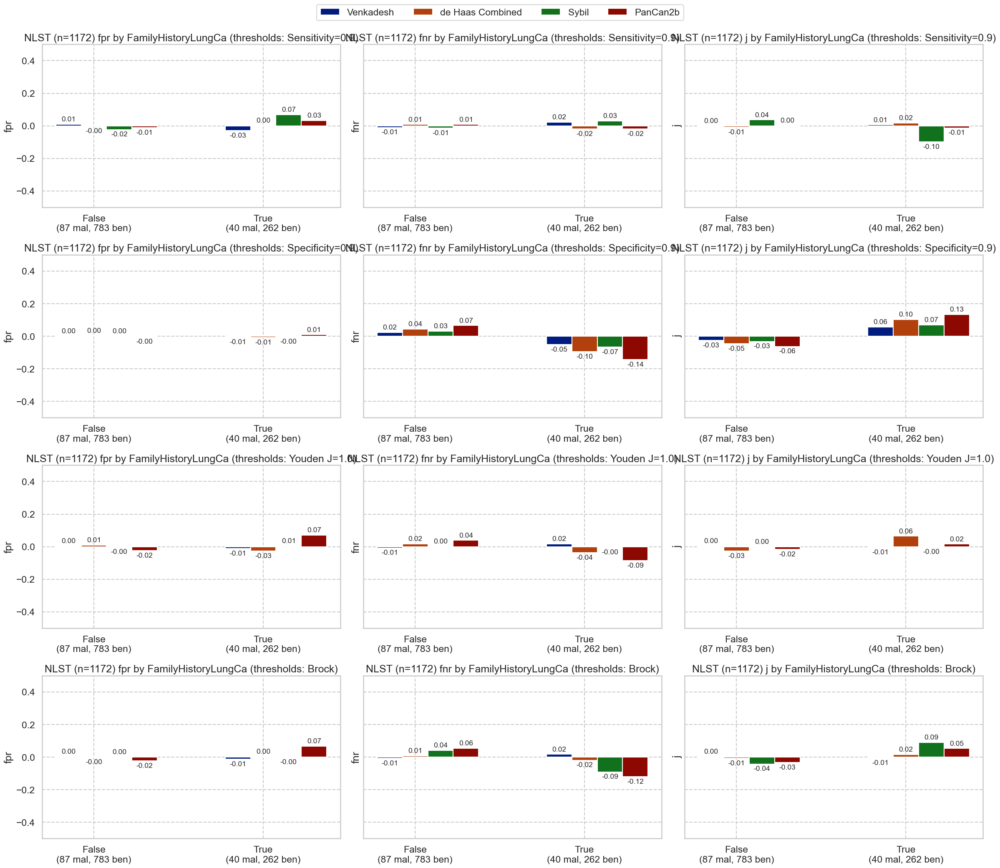

### PersonalCancerHist

,num,pct,num_mal,pct_mal
False,824,70.307167,80,9.708738
True,348,29.692833,47,13.505747


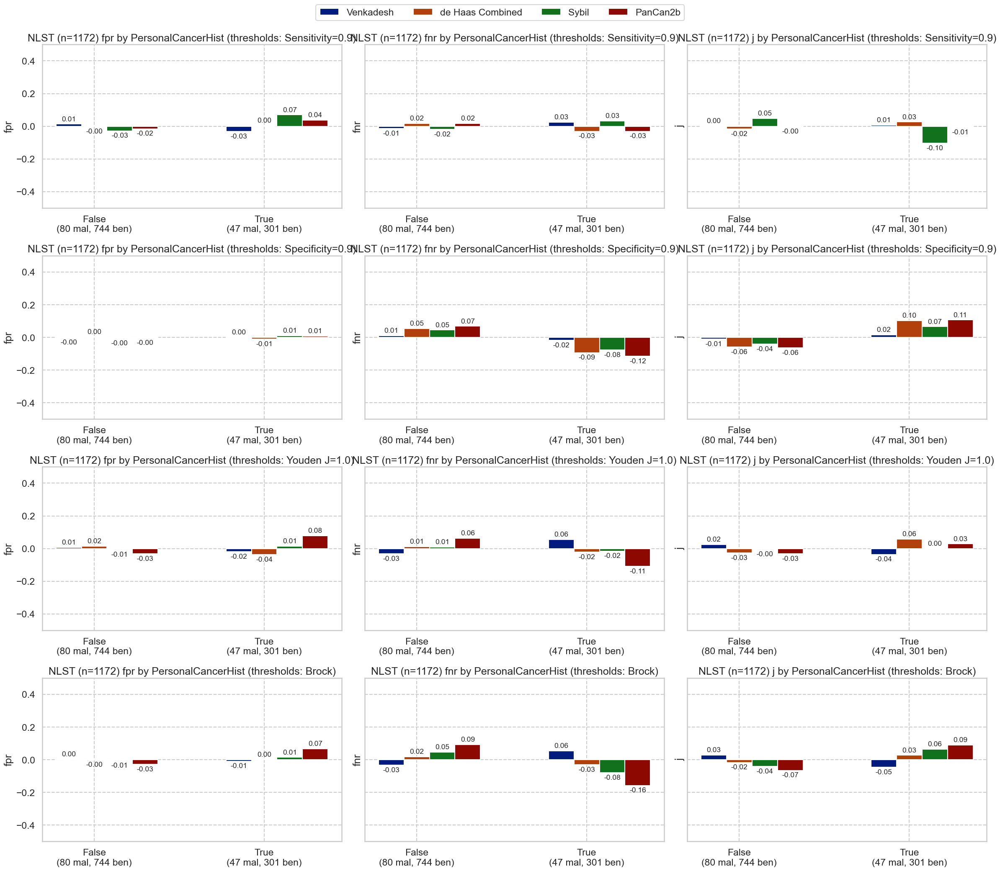

### Emphysema

,num,pct,num_mal,pct_mal
False,733,62.542662,70,9.549795
True,439,37.457338,57,12.984055


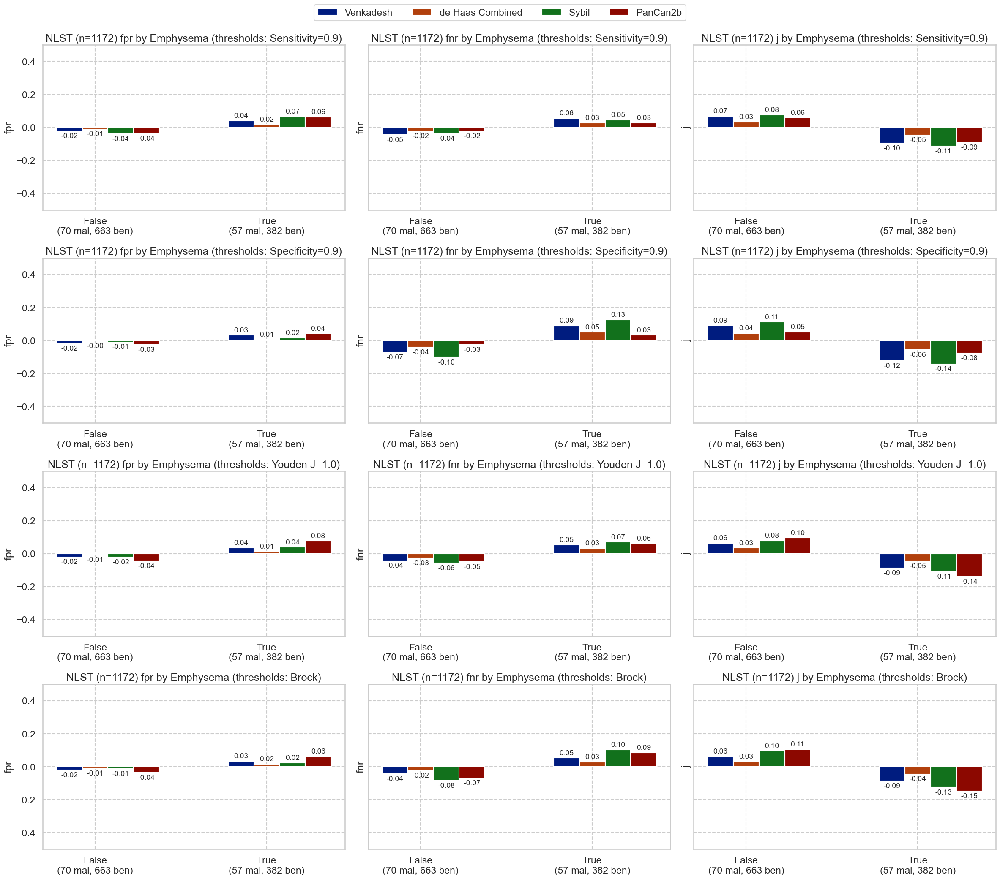

In [34]:
for c in nlst_democols['cat']['other']:
    plot_by_category(nlst_preds, c)

### Demographics

### marital

,num,pct,num_mal,pct_mal
1.0,46,3.924915,0,0.000000
2.0,785,66.979522,86,10.955414
3.0,120,10.238908,14,11.666667
4.0,19,1.621160,5,26.315789
5.0,202,17.235495,22,10.891089


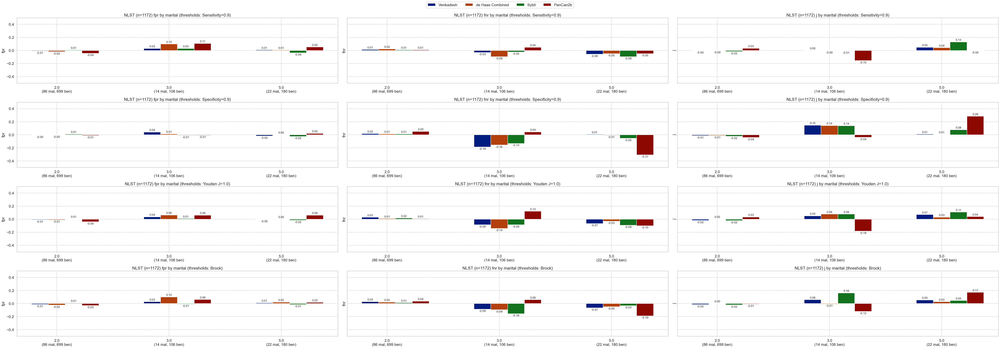

### educat

,num,pct,num_mal,pct_mal
1.0,27,2.341717,4,14.814815
2.0,67,5.810928,2,2.985075
3.0,307,26.626193,36,11.726384
4.0,144,12.489159,16,11.111111
5.0,244,21.162186,31,12.704918
6.0,185,16.045100,21,11.351351
7.0,179,15.524718,16,8.938547


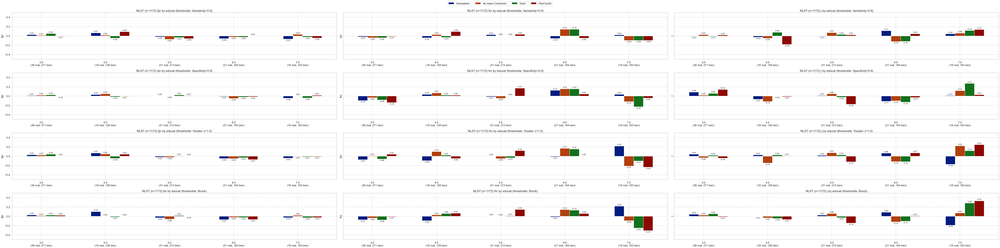

### race

,num,pct,num_mal,pct_mal
1.0,1098,93.926433,112,10.200364
2.0,40,3.421728,9,22.500000
3.0,7,0.598802,0,0.000000
4.0,10,0.855432,5,50.000000
5.0,3,0.256630,1,33.333333
6.0,11,0.940975,0,0.000000


Not enough malignant samples from multiple groups. SKIP


### ethnic

,num,pct,num_mal,pct_mal
1.0,11,0.940171,1,9.090909
2.0,1159,99.059829,126,10.871441


Not enough malignant samples from multiple groups. SKIP


### Gender

,num,pct,num_mal,pct_mal
1,693,59.129693,79,11.399711
2,479,40.870307,48,10.020877


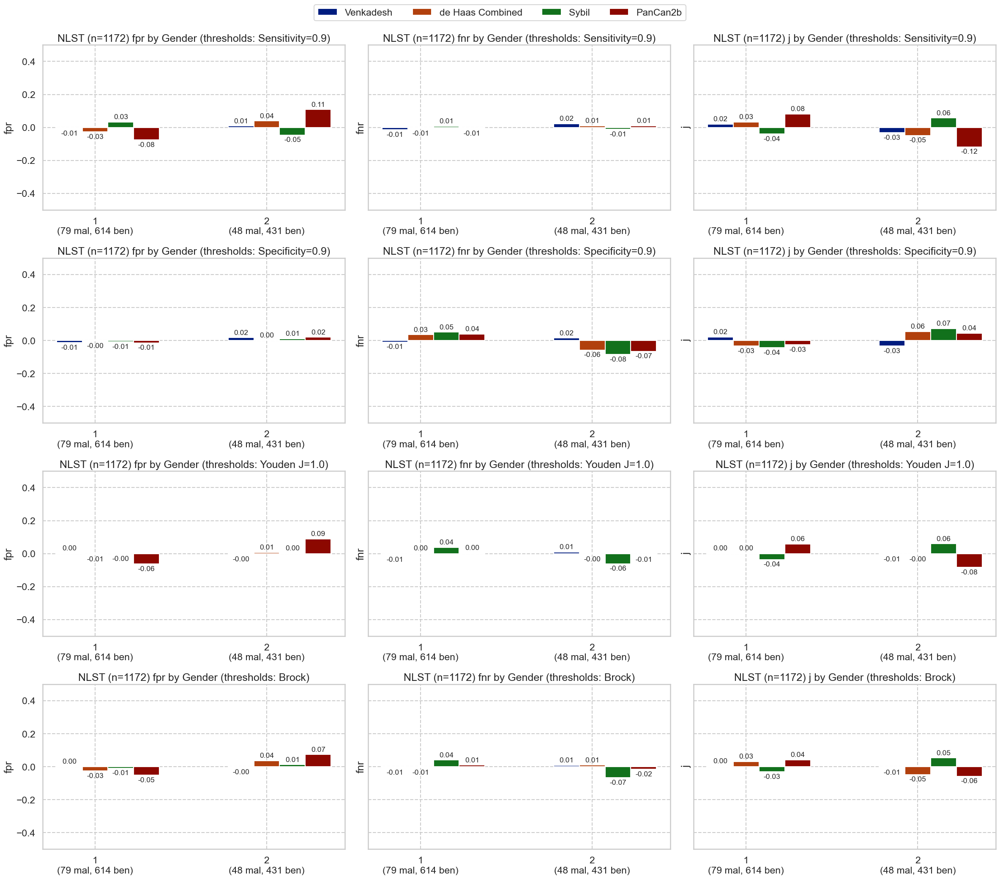

### Married

,num,pct,num_mal,pct_mal
False,387,33.020478,41,10.594315
True,785,66.979522,86,10.955414


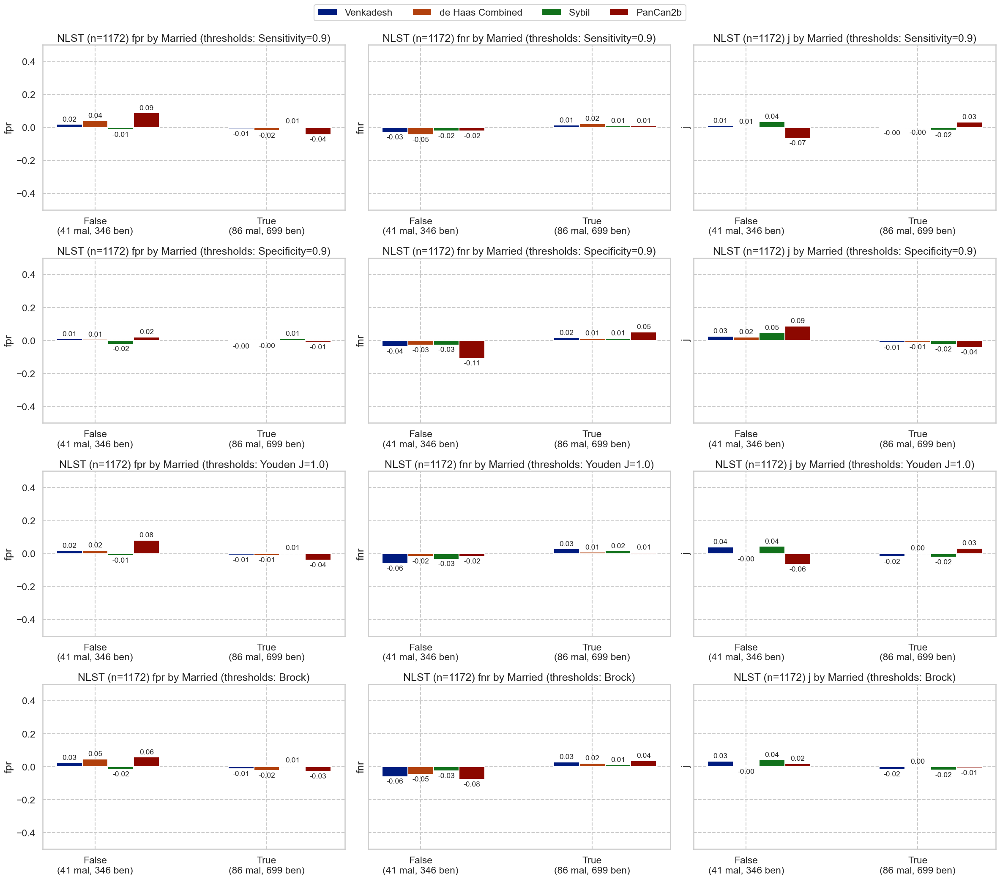

### NonHispanicWhite

,num,pct,num_mal,pct_mal
False,83,7.081911,16,19.277108
True,1089,92.918089,111,10.192837


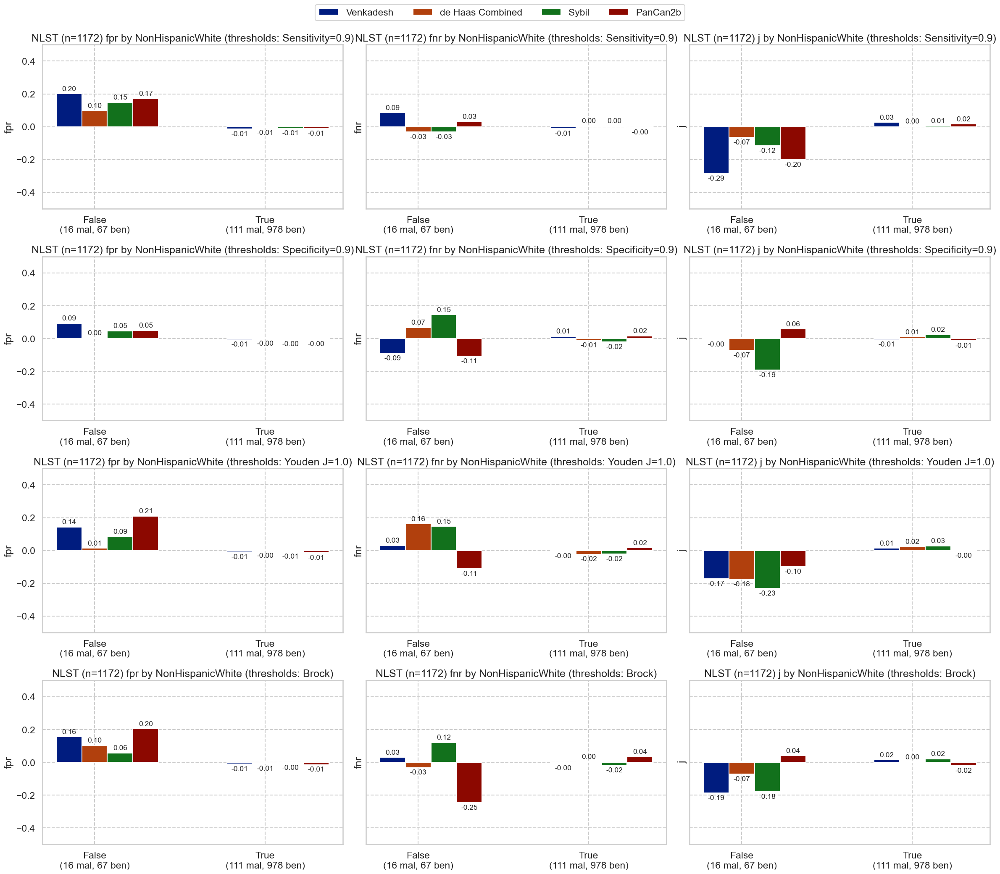

### HighSchoolPlus

,num,pct,num_mal,pct_mal
False,27,2.303754,4,14.814815
True,1145,97.696246,123,10.742358


Not enough malignant samples from multiple groups. SKIP


In [35]:
for cat in nlst_democols['cat']['demo']:
    plot_by_category(nlst_preds, cat)

### Smoking

### cigar

,num,pct,num_mal,pct_mal
0.0,931,79.845626,105,11.278195
1.0,235,20.154374,21,8.936170


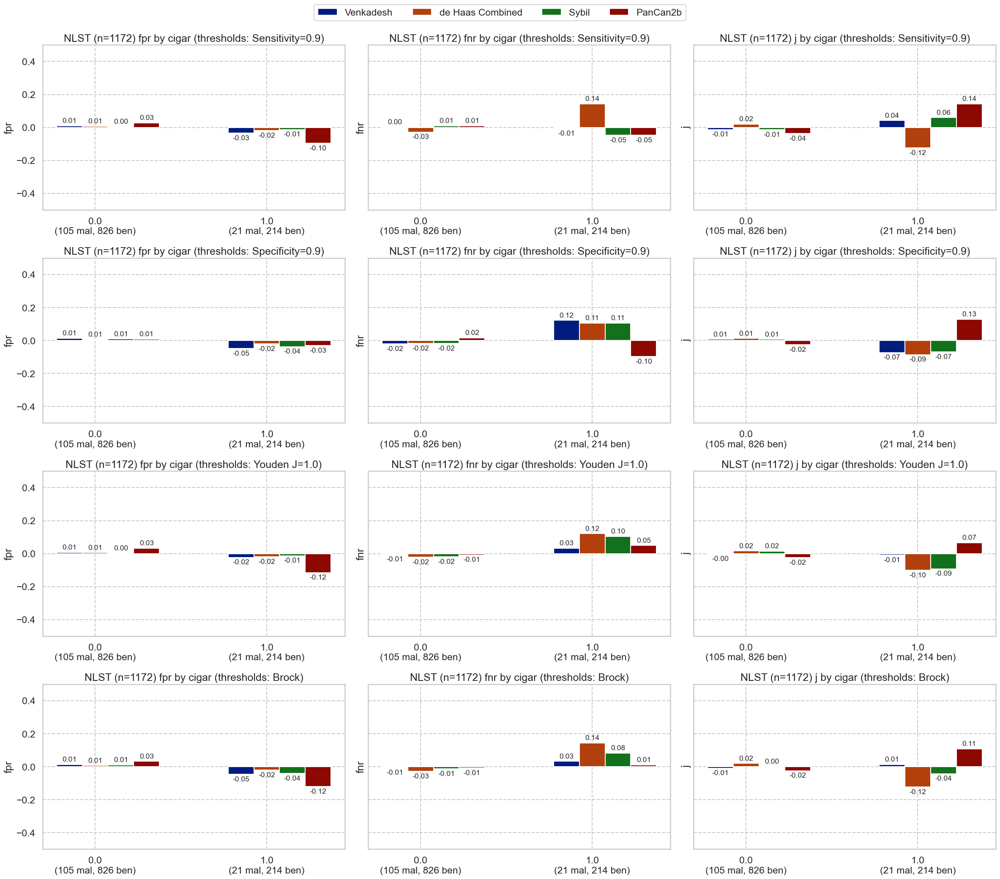

### cigsmok

,num,pct,num_mal,pct_mal
0,560,47.78157,46,8.214286
1,612,52.21843,81,13.235294


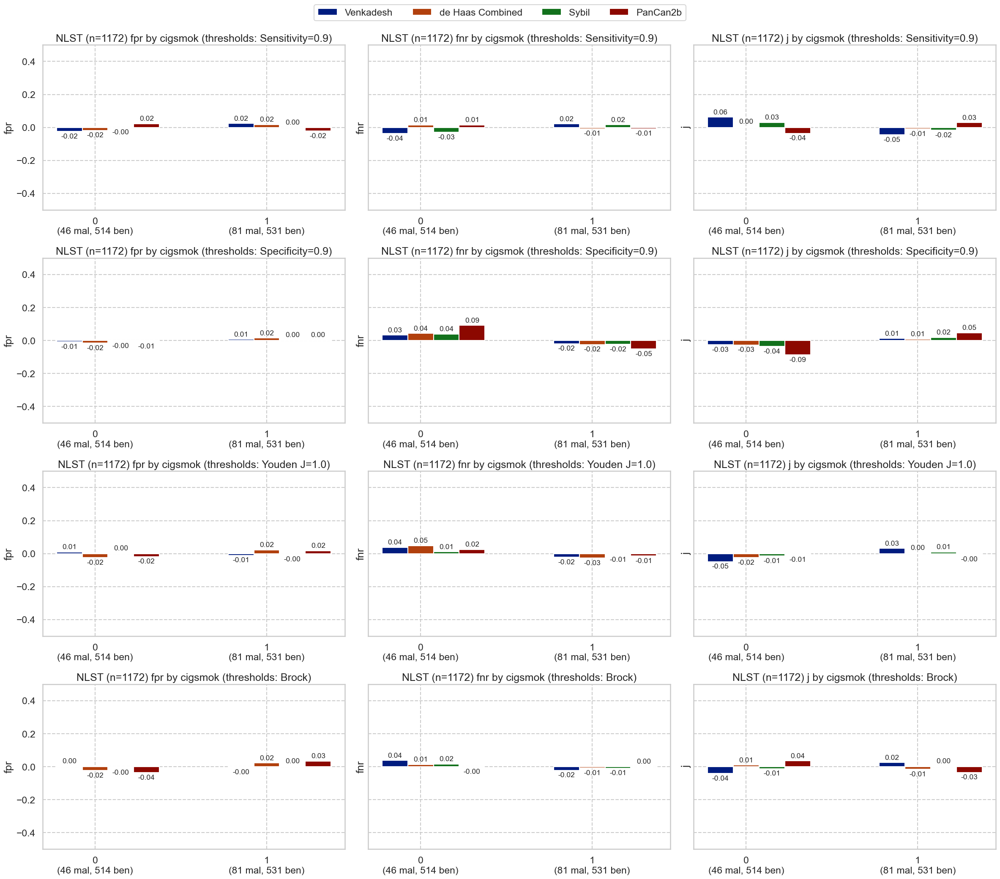

### pipe

,num,pct,num_mal,pct_mal
0.0,882,75.708155,87,9.863946
1.0,283,24.291845,39,13.780919


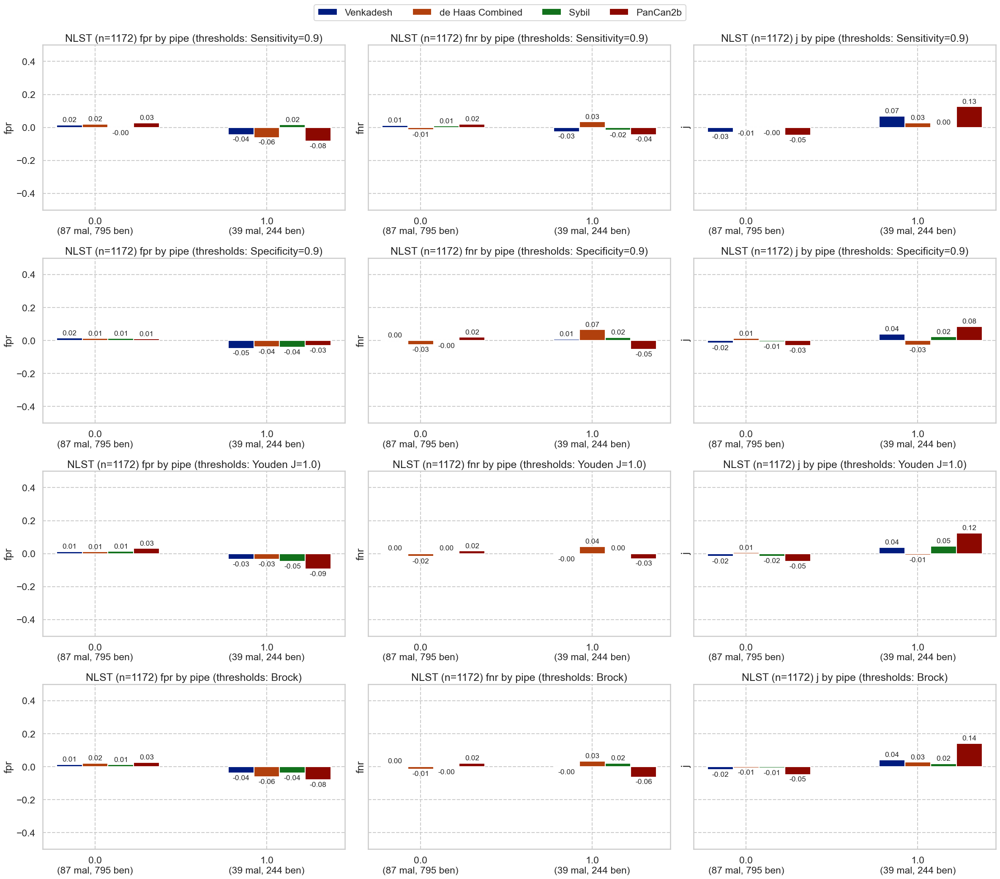

### smokelive

,num,pct,num_mal,pct_mal
0.0,139,11.910883,13,9.352518
1.0,1028,88.089117,113,10.992218


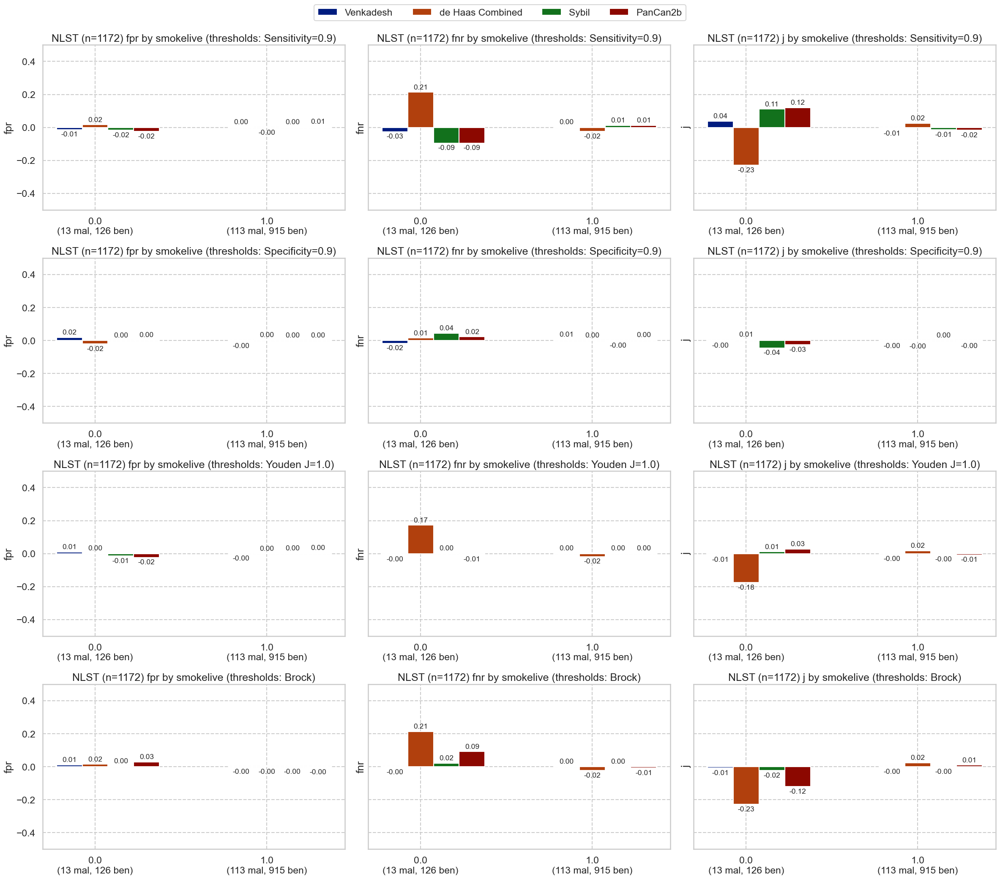

### smokework

,num,pct,num_mal,pct_mal
0.0,150,12.931034,16,10.666667
1.0,1010,87.068966,111,10.990099


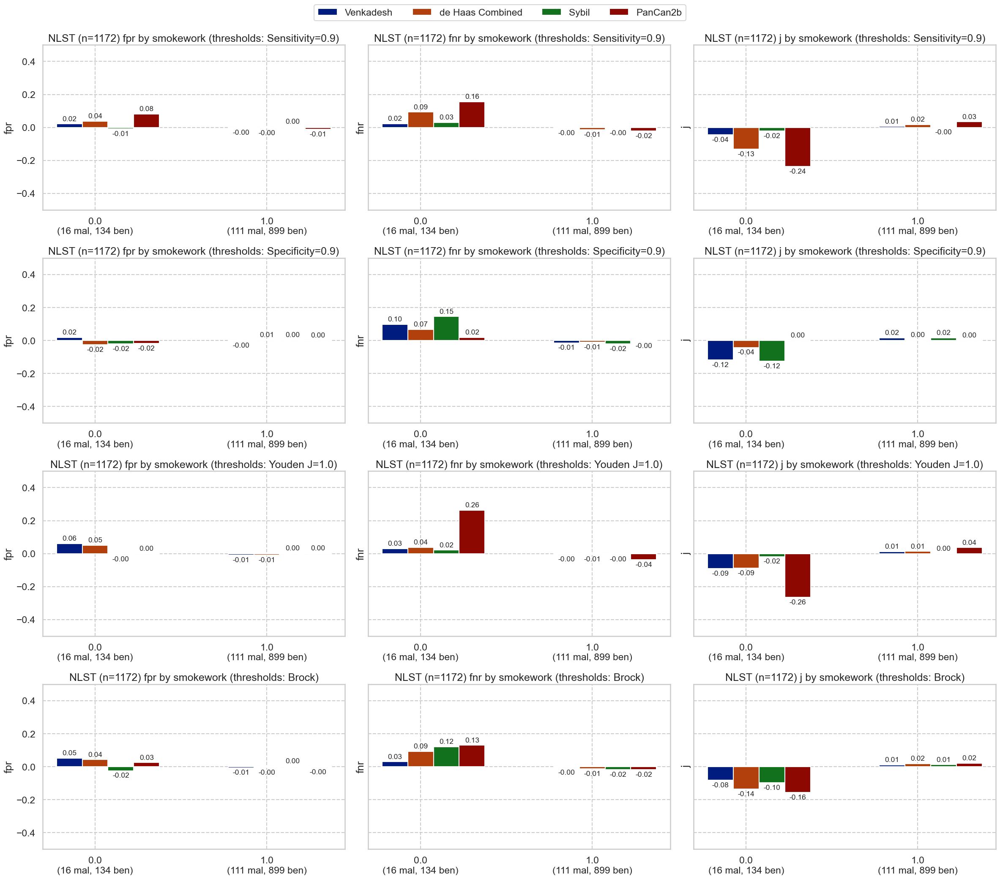

In [36]:
for cat in nlst_democols['cat']['smoke']:
    plot_by_category(nlst_preds, cat)

### Work history

### wrkasbe

,num,pct,num_mal,pct_mal
0.0,1082,92.320819,118,10.90573
1.0,90,7.679181,9,10.00000


Not enough malignant samples from multiple groups. SKIP


### wrkbaki

,num,pct,num_mal,pct_mal
0.0,1145,97.696246,124,10.829694
1.0,27,2.303754,3,11.111111


Not enough malignant samples from multiple groups. SKIP


### wrkbutc

,num,pct,num_mal,pct_mal
0.0,1154,98.464164,124,10.745234
1.0,18,1.535836,3,16.666667


Not enough malignant samples from multiple groups. SKIP


### wrkchem

,num,pct,num_mal,pct_mal
0.0,1087,92.826644,120,11.039558
1.0,84,7.173356,7,8.333333


Not enough malignant samples from multiple groups. SKIP


### wrkcoal

,num,pct,num_mal,pct_mal
0.0,1169,99.744027,126,10.778443
1.0,3,0.255973,1,33.333333


Not enough malignant samples from multiple groups. SKIP


### wrkcott

,num,pct,num_mal,pct_mal
0.0,1164,99.317406,125,10.738832
1.0,8,0.682594,2,25.000000


Not enough malignant samples from multiple groups. SKIP


### wrkfarm

,num,pct,num_mal,pct_mal
0.0,1019,86.945392,119,11.678116
1.0,153,13.054608,8,5.228758


Not enough malignant samples from multiple groups. SKIP


### wrkfire

,num,pct,num_mal,pct_mal
0.0,1153,98.37884,124,10.754553
1.0,19,1.62116,3,15.789474


Not enough malignant samples from multiple groups. SKIP


### wrkflou

,num,pct,num_mal,pct_mal
0.0,1153,98.37884,127,11.014744
1.0,19,1.62116,0,0.000000


Not enough malignant samples from multiple groups. SKIP


### wrkfoun

,num,pct,num_mal,pct_mal
0.0,1124,95.904437,116,10.320285
1.0,48,4.095563,11,22.916667


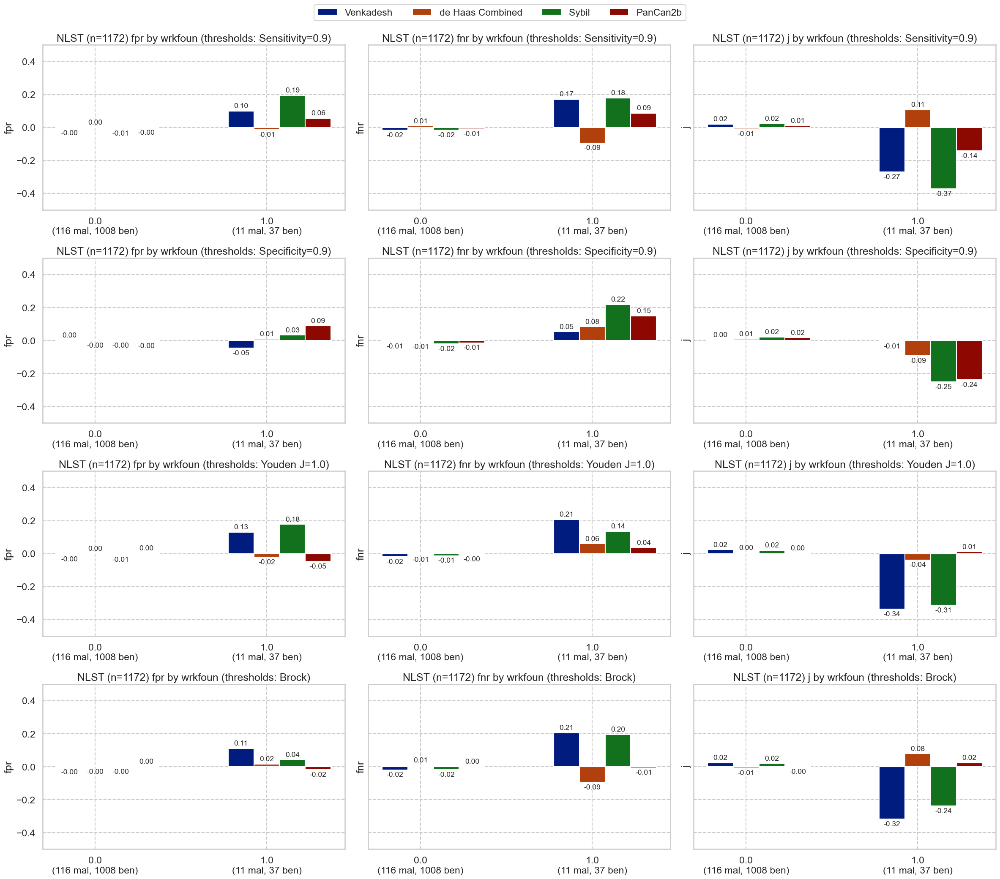

### wrkhard

,num,pct,num_mal,pct_mal
0.0,1162,99.146758,127,10.929432
1.0,10,0.853242,0,0.000000


Not enough malignant samples from multiple groups. SKIP


### wrkpain

,num,pct,num_mal,pct_mal
0.0,1099,93.771331,120,10.919017
1.0,73,6.228669,7,9.589041


Not enough malignant samples from multiple groups. SKIP


### wrksand

,num,pct,num_mal,pct_mal
0.0,1142,97.440273,120,10.507881
1.0,30,2.559727,7,23.333333


Not enough malignant samples from multiple groups. SKIP


### wrkweld

,num,pct,num_mal,pct_mal
0.0,1092,93.174061,116,10.622711
1.0,80,6.825939,11,13.750000


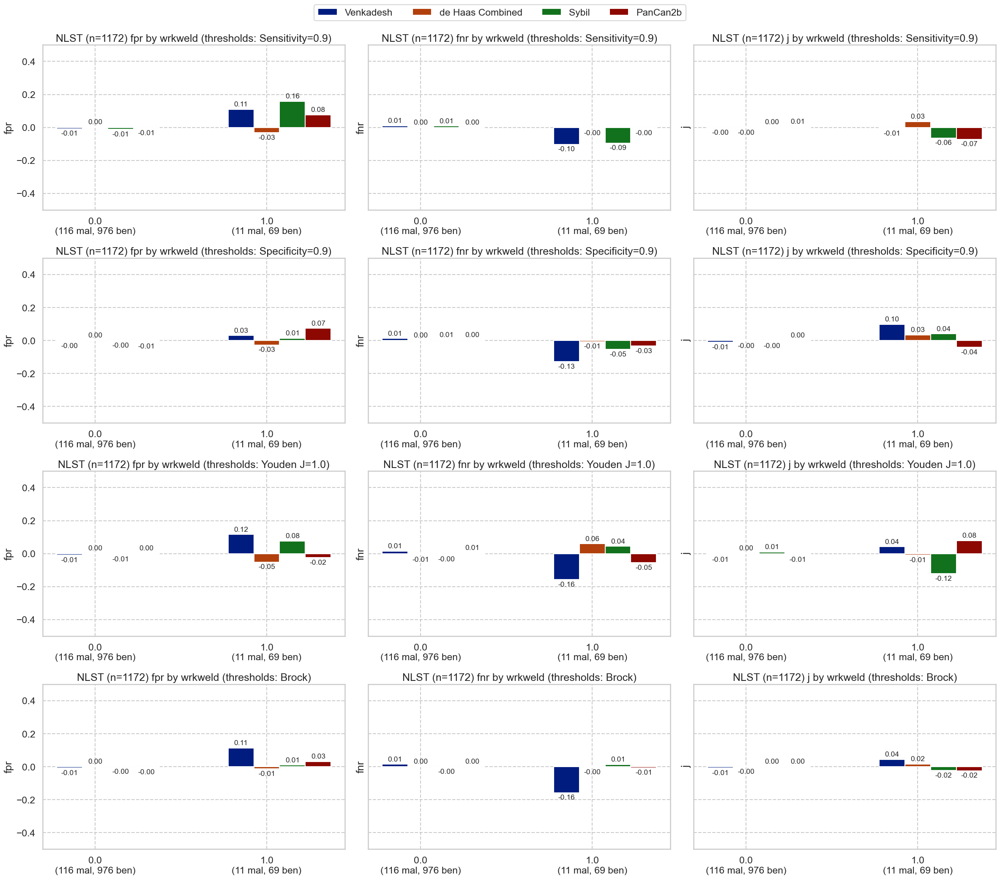

In [37]:
for cat in nlst_democols['cat']['work']:
    plot_by_category(nlst_preds, cat)

### Disease history

### Emphysema

,num,pct,num_mal,pct_mal
False,733,62.542662,70,9.549795
True,439,37.457338,57,12.984055


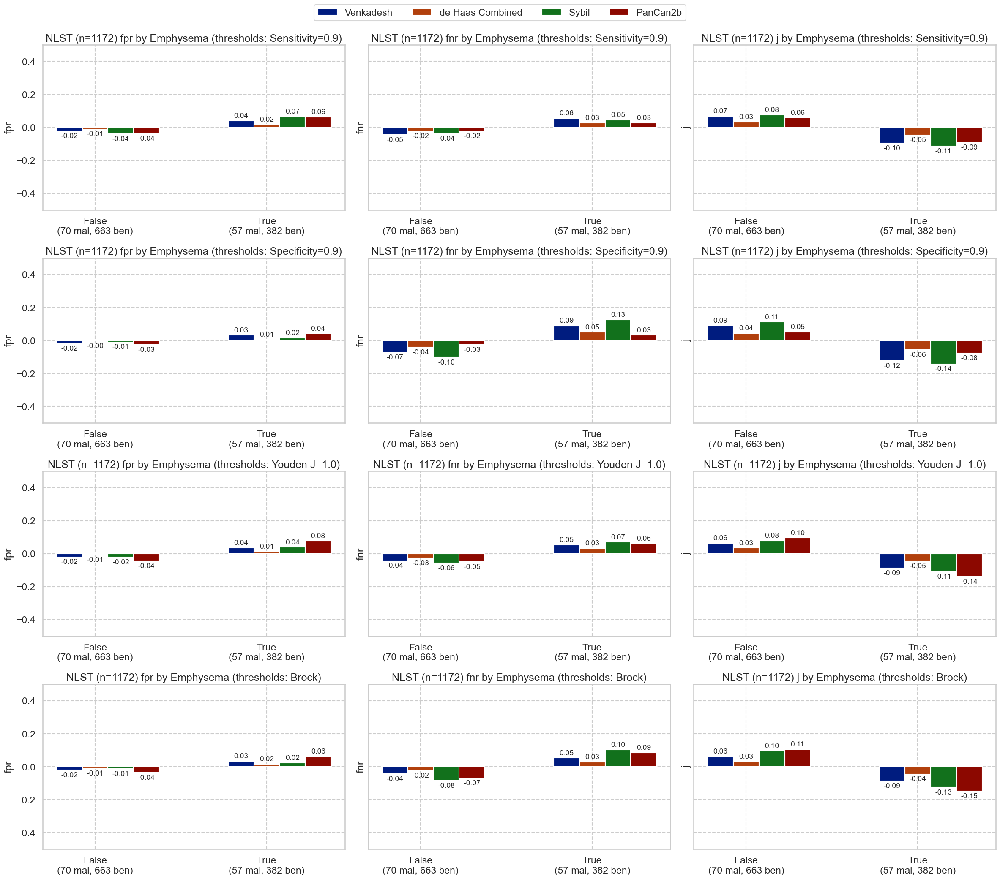

In [38]:
plot_by_category(nlst_preds, 'Emphysema')

### diagadas

,num,pct,num_mal,pct_mal
0.0,1102,94.027304,118,10.707804
1.0,70,5.972696,9,12.857143


Not enough malignant samples from multiple groups. SKIP


### diagasbe

,num,pct,num_mal,pct_mal
0.0,1147,98.034188,127,11.072363
1.0,23,1.965812,0,0.000000


Not enough malignant samples from multiple groups. SKIP


### diagbron

,num,pct,num_mal,pct_mal
0.0,1121,95.811966,124,11.061552
1.0,49,4.188034,3,6.122449


Not enough malignant samples from multiple groups. SKIP


### diagchas

,num,pct,num_mal,pct_mal
0.0,1138,97.098976,125,10.984183
1.0,34,2.901024,2,5.882353


Not enough malignant samples from multiple groups. SKIP


### diagchro

,num,pct,num_mal,pct_mal
0.0,1035,88.613014,110,10.628019
1.0,133,11.386986,17,12.781955


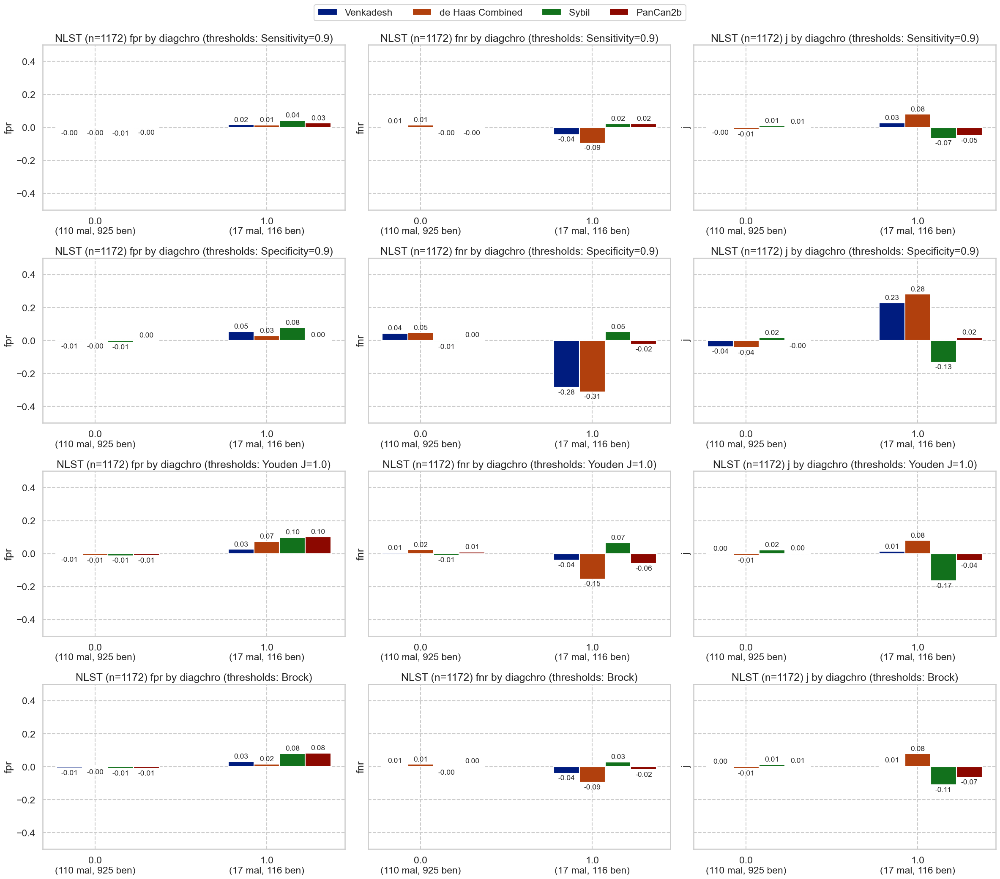

### diagcopd

,num,pct,num_mal,pct_mal
0.0,1088,92.991453,120,11.029412
1.0,82,7.008547,7,8.536585


Not enough malignant samples from multiple groups. SKIP


### diagdiab

,num,pct,num_mal,pct_mal
0.0,1046,89.249147,108,10.325048
1.0,126,10.750853,19,15.079365


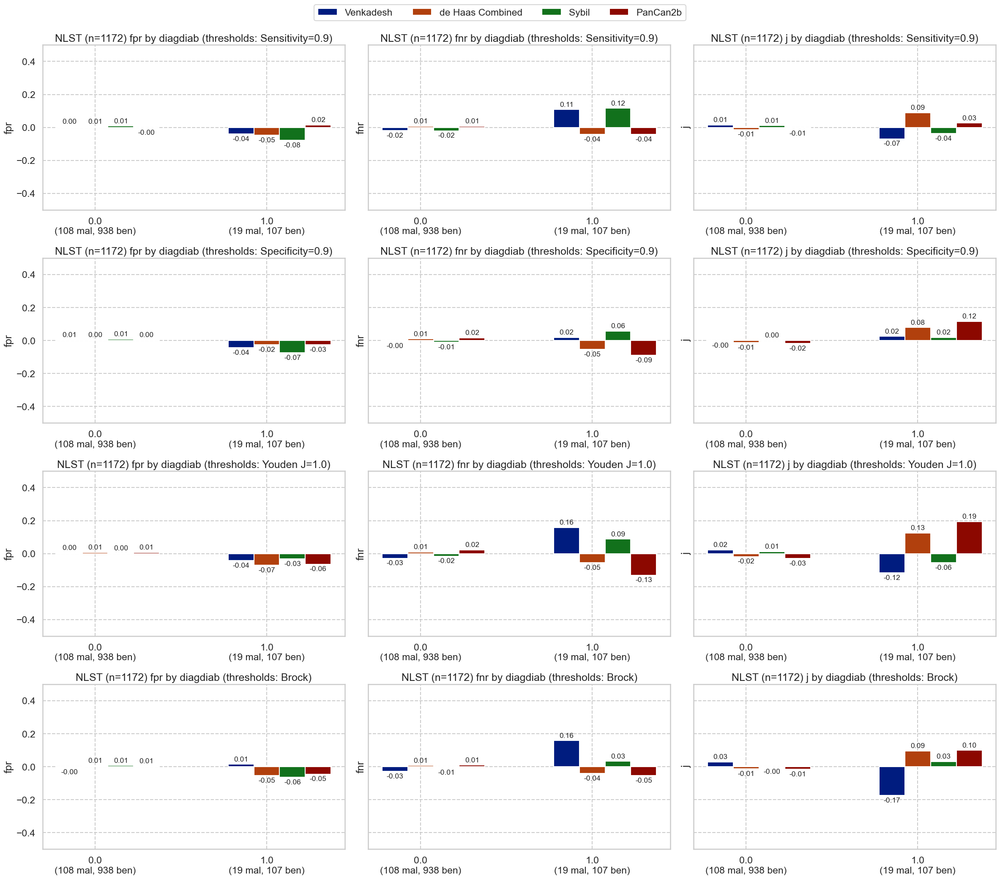

### diagemph

,num,pct,num_mal,pct_mal
0.0,1031,88.270548,112,10.863240
1.0,137,11.729452,15,10.948905


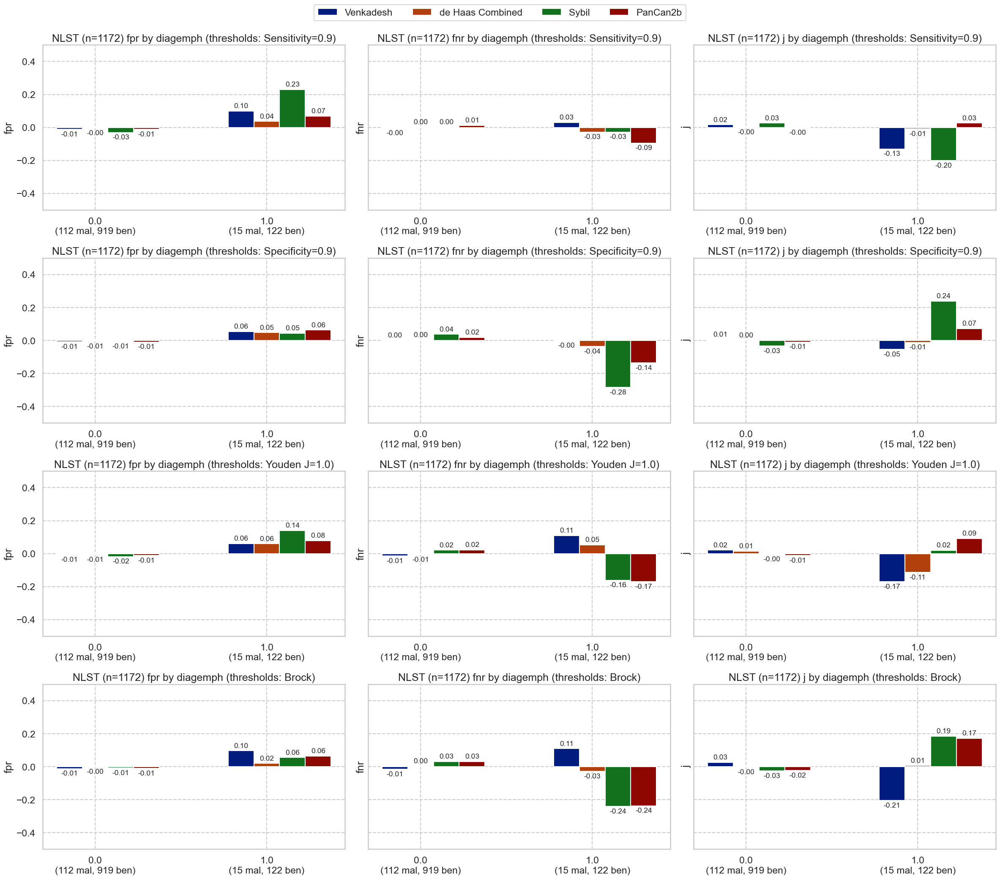

### diagfibr

,num,pct,num_mal,pct_mal
0.0,1166,99.488055,127,10.891938
1.0,6,0.511945,0,0.000000


Not enough malignant samples from multiple groups. SKIP


### diaghear

,num,pct,num_mal,pct_mal
0.0,1017,87.071918,114,11.209440
1.0,151,12.928082,13,8.609272


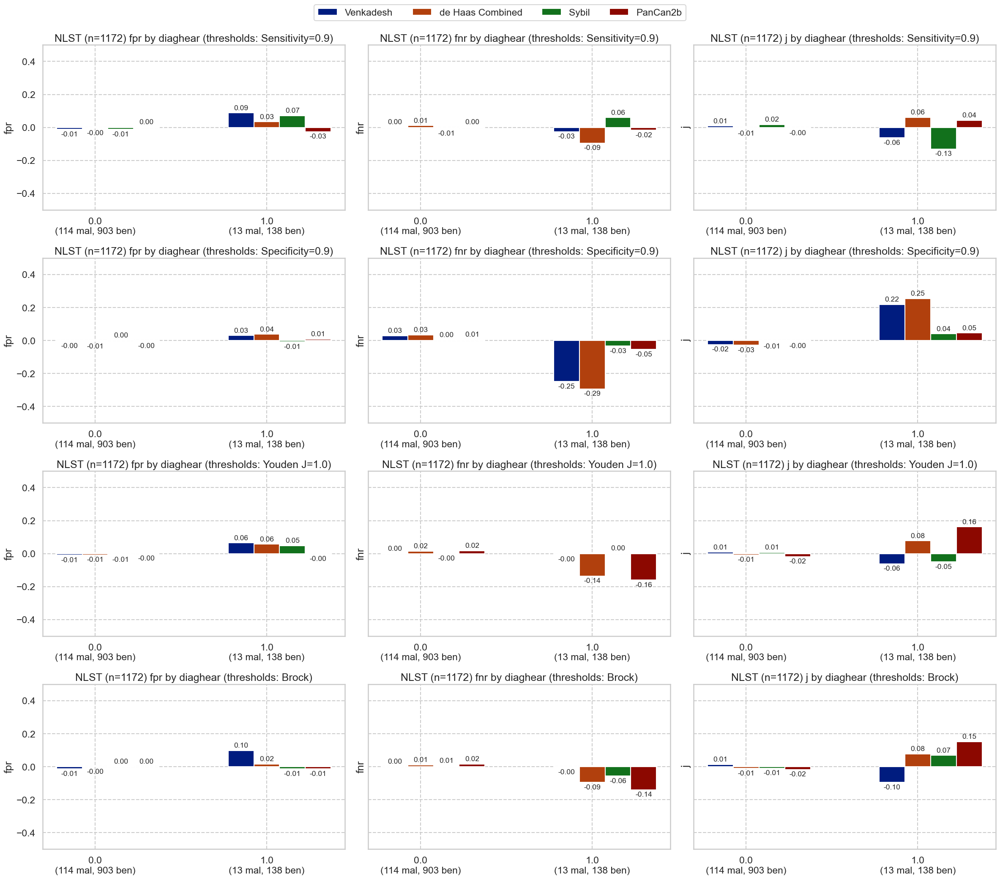

### diaghype

,num,pct,num_mal,pct_mal
0.0,778,66.609589,80,10.282776
1.0,390,33.390411,44,11.282051


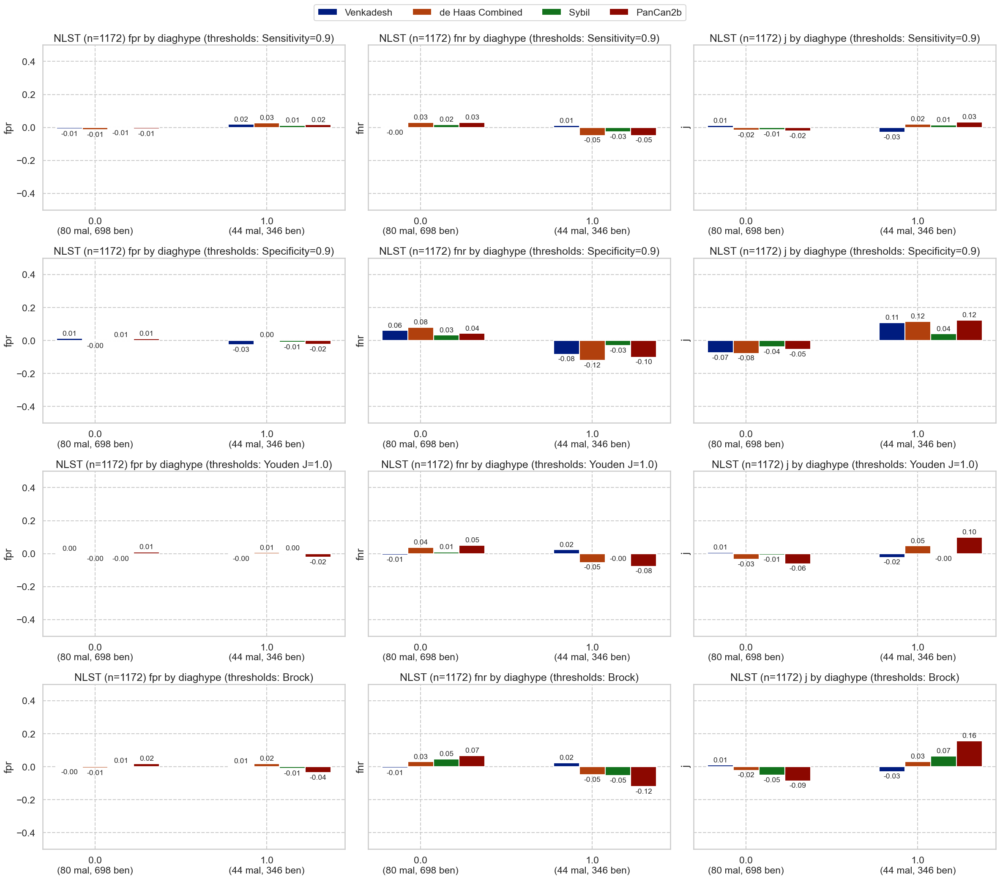

### diagpneu

,num,pct,num_mal,pct_mal
0.0,897,76.535836,102,11.371237
1.0,275,23.464164,25,9.090909


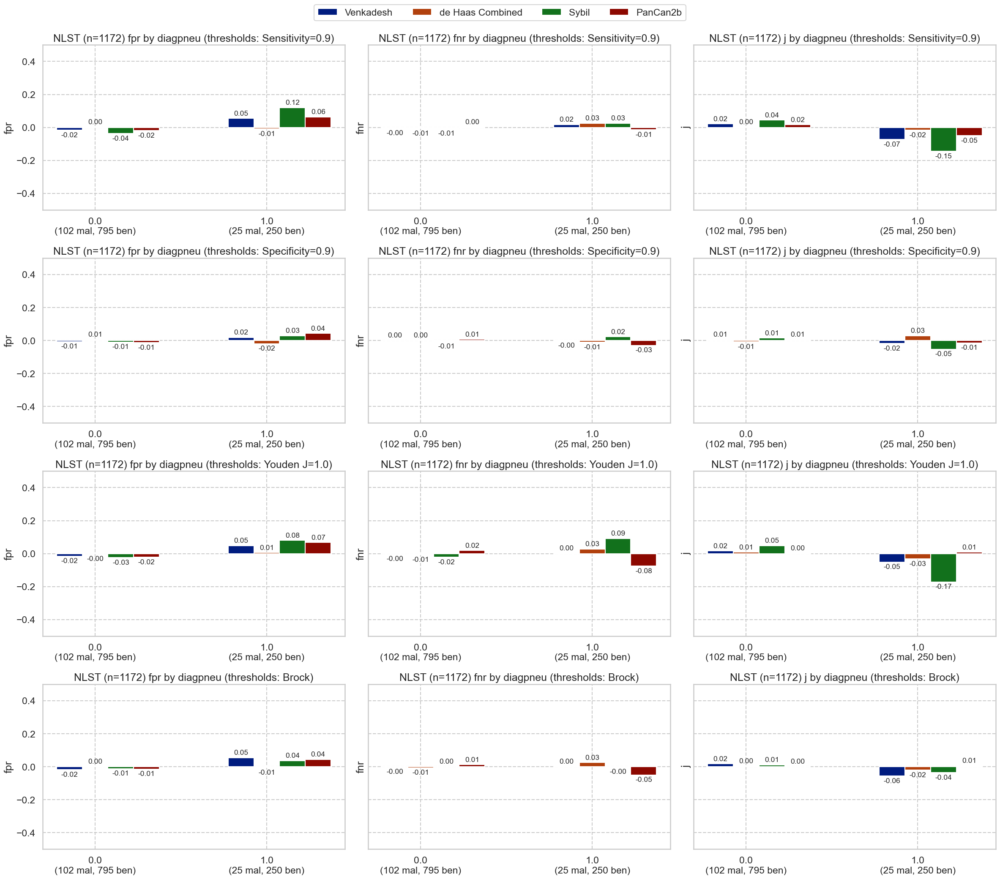

### diagsarc

,num,pct,num_mal,pct_mal
0.0,1170,99.829352,126,10.769231
1.0,2,0.170648,1,50.000000


Not enough malignant samples from multiple groups. SKIP


### diagsili

,num,pct,num_mal,pct_mal
0.0,1170,99.829352,127,10.854701
1.0,2,0.170648,0,0.000000


Not enough malignant samples from multiple groups. SKIP


### diagstro

,num,pct,num_mal,pct_mal
0.0,1129,96.331058,117,10.363153
1.0,43,3.668942,10,23.255814


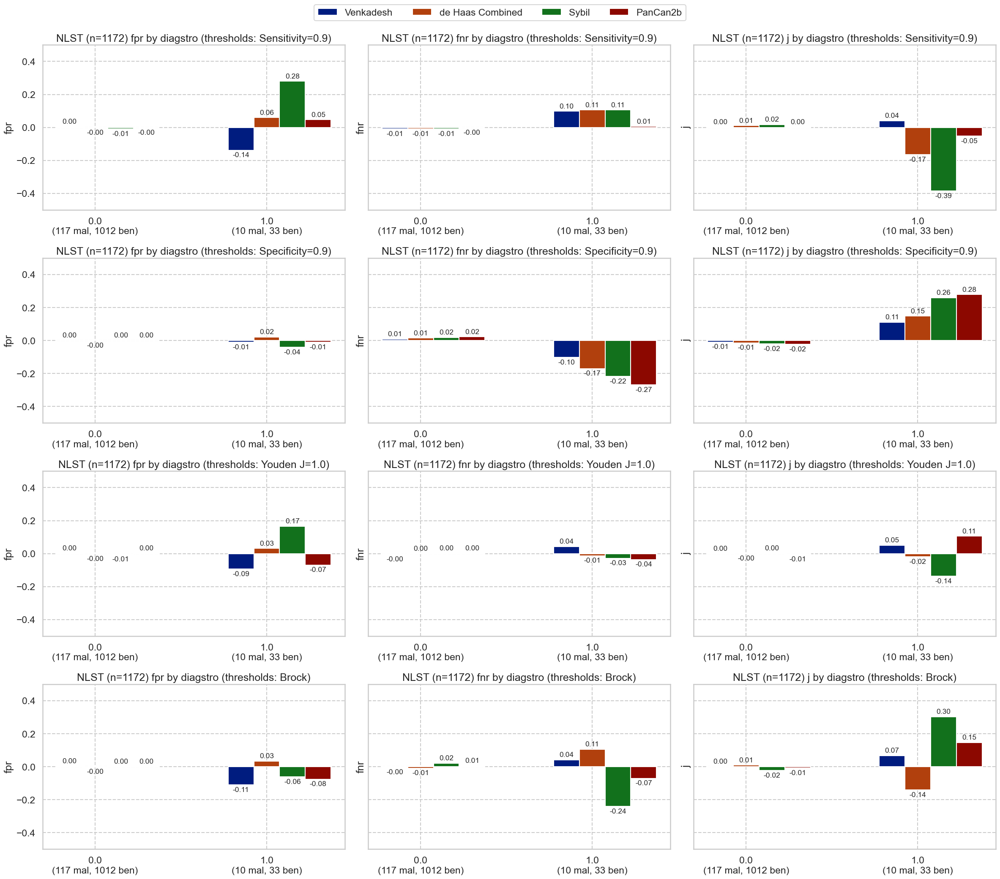

### diagtube

,num,pct,num_mal,pct_mal
0.0,1148,97.952218,127,11.062718
1.0,24,2.047782,0,0.000000


Not enough malignant samples from multiple groups. SKIP


In [39]:
for cat in nlst_democols['cat']['disease']:
    plot_by_category(nlst_preds, cat)

## Binning for numerical columns

### Demographic columns

#### height

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,68.096651,3.856283,59.0,65.0,68.0,71.0,78.0
1,127.0,68.417323,3.736225,60.0,66.0,69.0,71.0,76.0


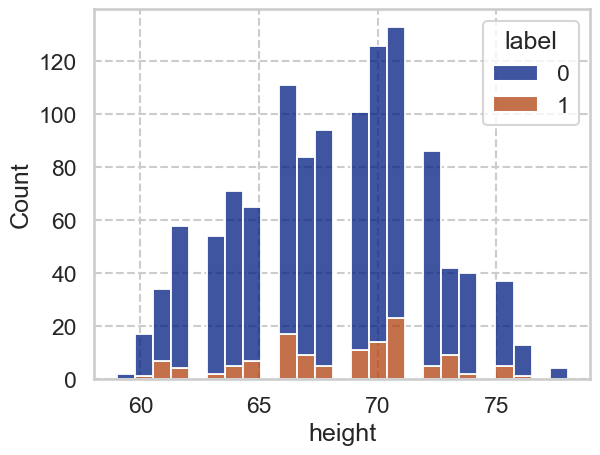

#### weight

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1044.0,183.356322,39.848243,90.0,157.0,180.0,206.0,315.0
1,127.0,178.244094,36.405720,108.0,157.0,180.0,200.0,322.0


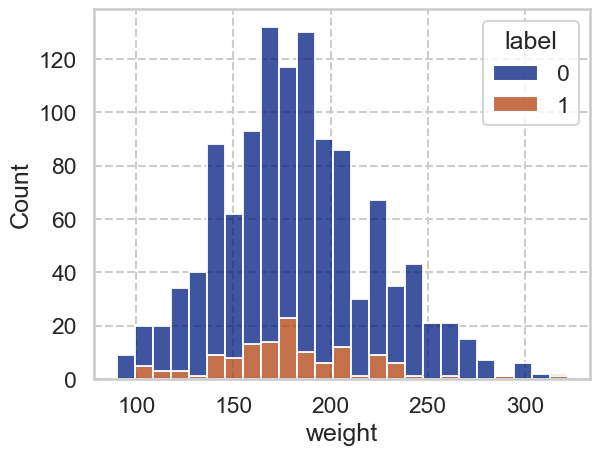

#### Age

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,63.199043,5.379523,55.0,59.0,62.0,67.0,76.0
1,127.0,64.062992,5.226228,55.0,60.5,63.0,68.0,75.0


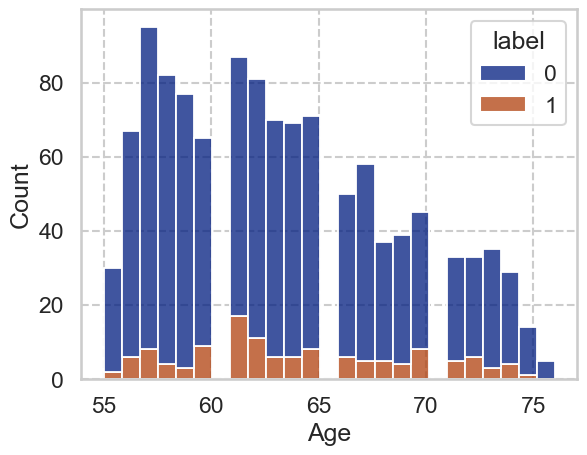

#### BMI

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1044.0,27.651995,4.893146,16.242386,24.271788,27.258353,30.685928,51.010481
1,127.0,26.658295,4.558551,18.302959,23.745543,25.824490,29.130280,47.587692


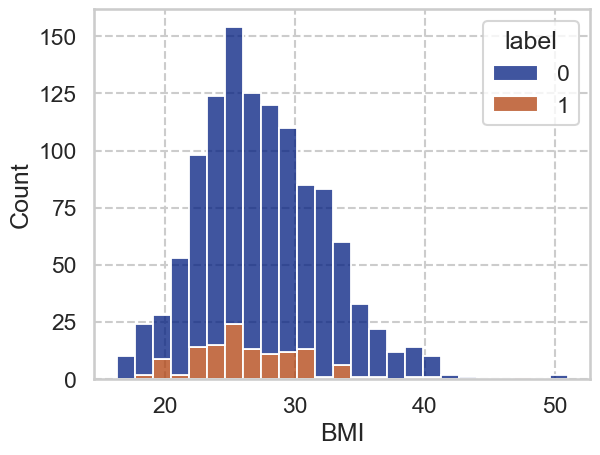

In [40]:
for c in nlst_democols['num']['demo']:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              height  \
                count      mean       std  min  25%  50%  75%  max  count   
bin_height                                                                  
(58.999, 68.0]  590.0  0.096610  0.295677  0.0  0.0  0.0  0.0  1.0  590.0   
(68.0, 78.0]    582.0  0.120275  0.325563  0.0  0.0  0.0  0.0  1.0  582.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_height                                                         
(58.999, 68.0]  64.957627  2.309624  59.0  63.0  65.0  67.0  68.0  
(68.0, 78.0]    71.348797  1.939797  69.0  70.0  71.0  72.0  78.0

### bin_height

C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\199615580.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


,num,pct,num_mal,pct_mal
"(58.999, 68.0]",590,50.341297,57,9.661017
"(68.0, 78.0]",582,49.658703,70,12.027491


C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\199615580.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)
C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\199615580.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)
C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\199615580.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)
C:\Users\shau

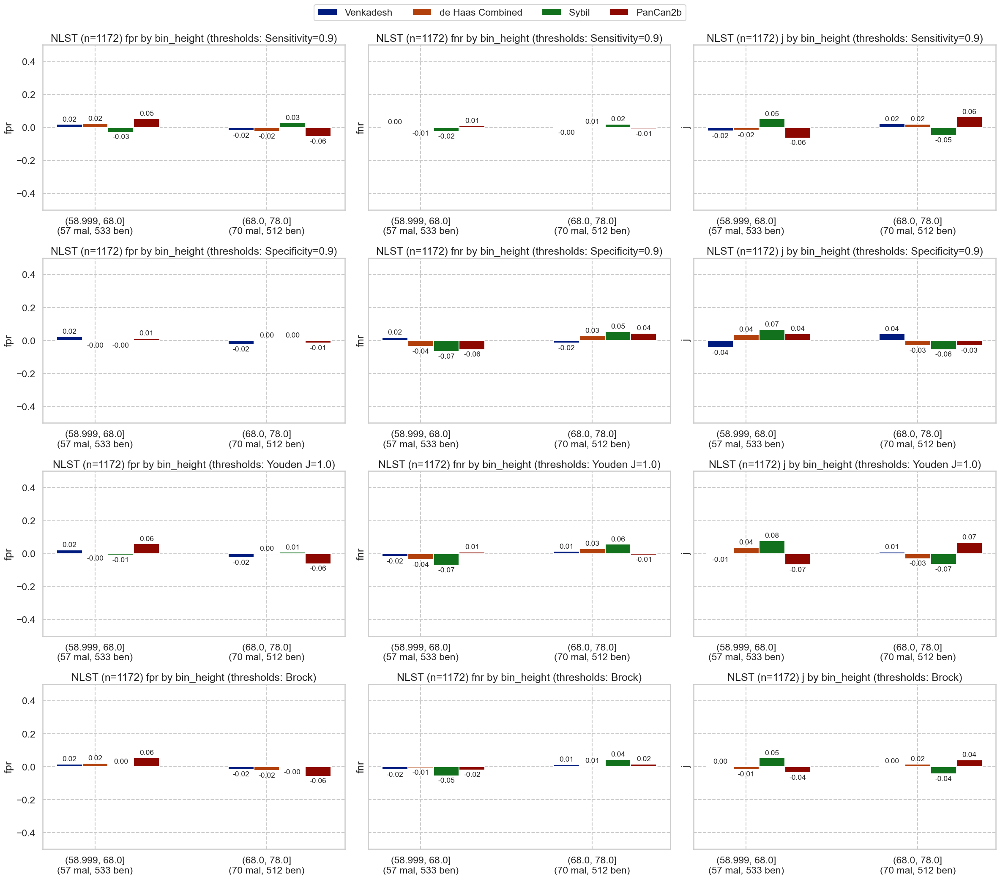

C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              weight  \
                 count      mean       std  min  25%  50%  75%  max  count   
bin_weight                                                                   
(89.999, 180.0]  605.0  0.120661  0.326003  0.0  0.0  0.0  0.0  1.0  605.0   
(180.0, 322.0]   566.0  0.095406  0.294035  0.0  0.0  0.0  0.0  1.0  566.0   

                                                                           
                       mean        std    min    25%    50%    75%    max  
bin_weight                                                                 
(89.999, 180.0]  152.778512  21.066998   90.0  140.0  158.0  170.0  180.0  
(180.0, 322.0]   214.893993  27.580217  181.0  193.0  206.0  230.0  322.0

### bin_weight

C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\199615580.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


,num,pct,num_mal,pct_mal
"(89.999, 180.0]",605,51.665243,73,12.066116
"(180.0, 322.0]",566,48.334757,54,9.540636


C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\199615580.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)
C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\199615580.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)
C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\199615580.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)
C:\Users\shau

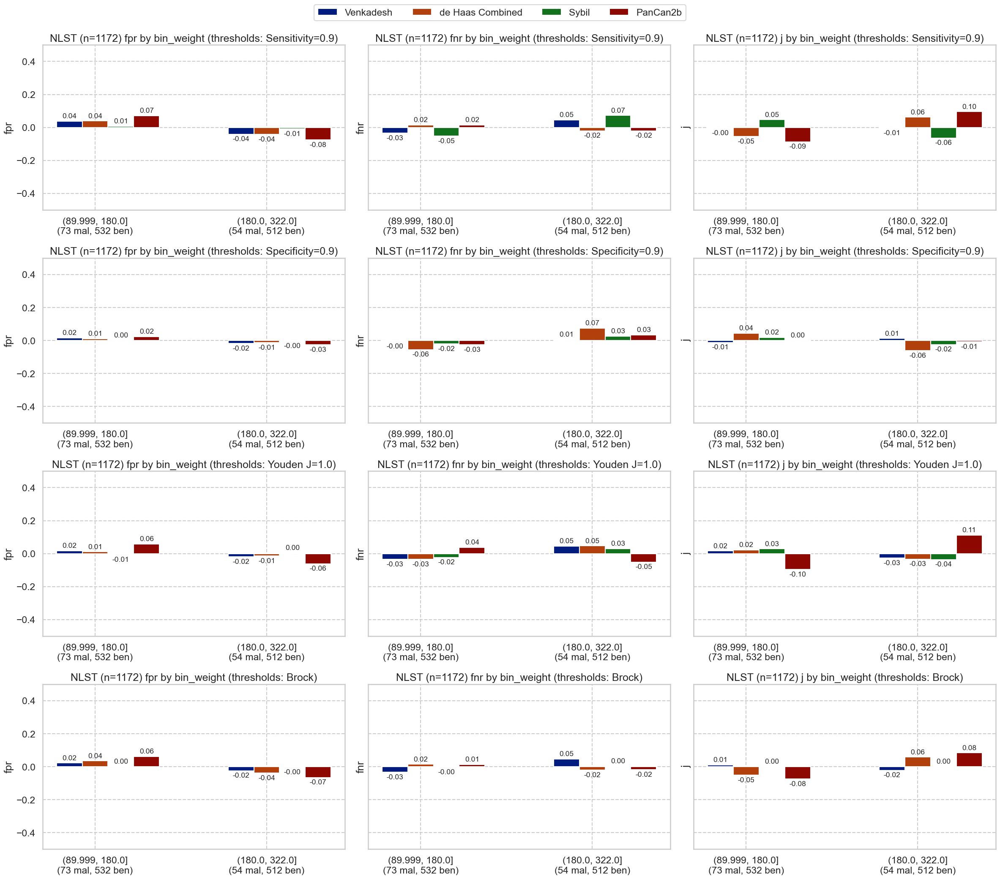

C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                                 Age  \
                count      mean       std  min  25%  50%  75%  max  count   
bin_Age                                                                     
(54.999, 63.0]  654.0  0.100917  0.301450  0.0  0.0  0.0  0.0  1.0  654.0   
(63.0, 76.0]    518.0  0.117761  0.322636  0.0  0.0  0.0  0.0  1.0  518.0   

                                                                  
                    mean       std   min   25%   50%   75%   max  
bin_Age                                                           
(54.999, 63.0]  59.25841  2.400654  55.0  57.0  59.0  61.0  63.0  
(63.0, 76.0]    68.38610  3.376096  64.0  65.0  68.0  71.0  76.0

### bin_Age

C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\199615580.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


,num,pct,num_mal,pct_mal
"(54.999, 63.0]",654,55.802048,66,10.091743
"(63.0, 76.0]",518,44.197952,61,11.776062


C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\199615580.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)
C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\199615580.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)
C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\199615580.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)
C:\Users\shau

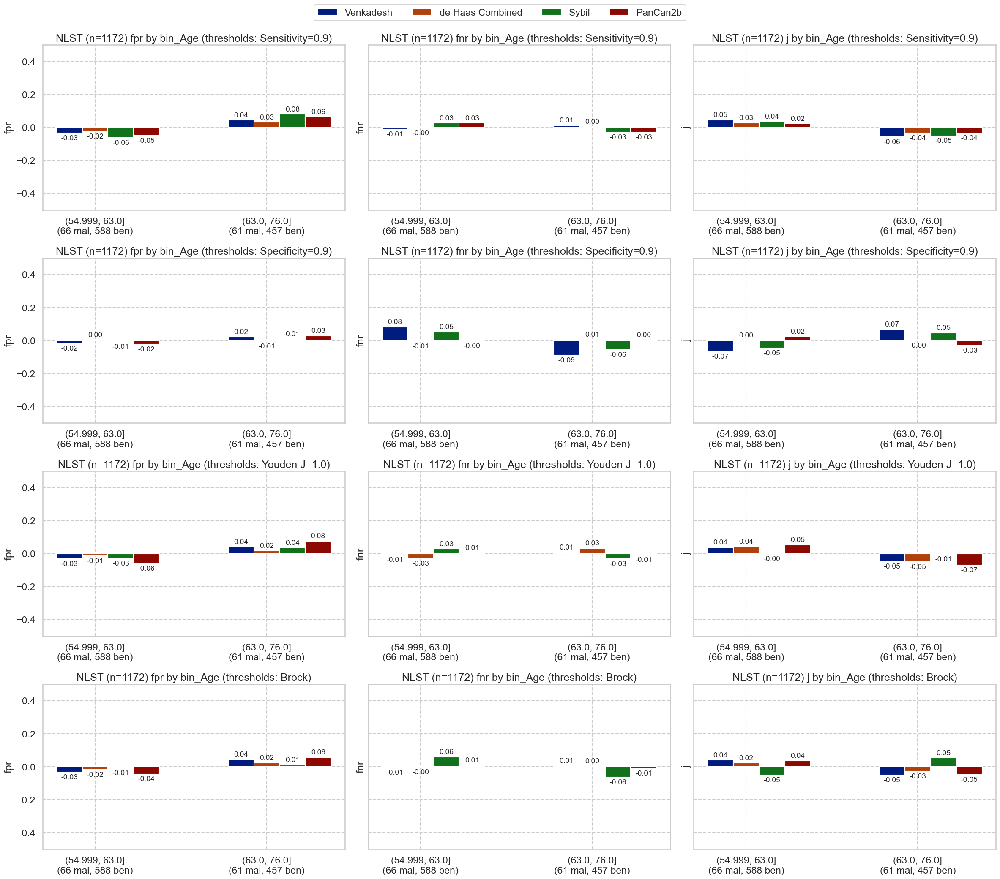

C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                                 BMI  \
                  count      mean       std  min  25%  50%  75%  max  count   
bin_BMI                                                                       
(16.241, 27.044]  586.0  0.127986  0.334360  0.0  0.0  0.0  0.0  1.0  586.0   
(27.044, 51.01]   585.0  0.088889  0.284827  0.0  0.0  0.0  0.0  1.0  585.0   

                                                                        \
                       mean       std        min        25%        50%   
bin_BMI                                                                  
(16.241, 27.044]  23.719689  2.357405  16.242386  22.440233  24.221202   
(27.044, 51.01]   31.375296  3.534062  27.092671  28.734213  30.565217   

                                        
                        75%        max  
bin_BMI                                 
(16.241, 27.044]  25.716379  27.043535  
(27.044, 51.01]   33.190637  51.010481

### bin_BMI

C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\199615580.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


,num,pct,num_mal,pct_mal
"(16.241, 27.044]",586,50.042699,75,12.798635
"(27.044, 51.01]",585,49.957301,52,8.888889


C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\199615580.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)
C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\199615580.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)
C:\Users\shaur\AppData\Local\Temp\ipykernel_14168\199615580.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)
C:\Users\shau

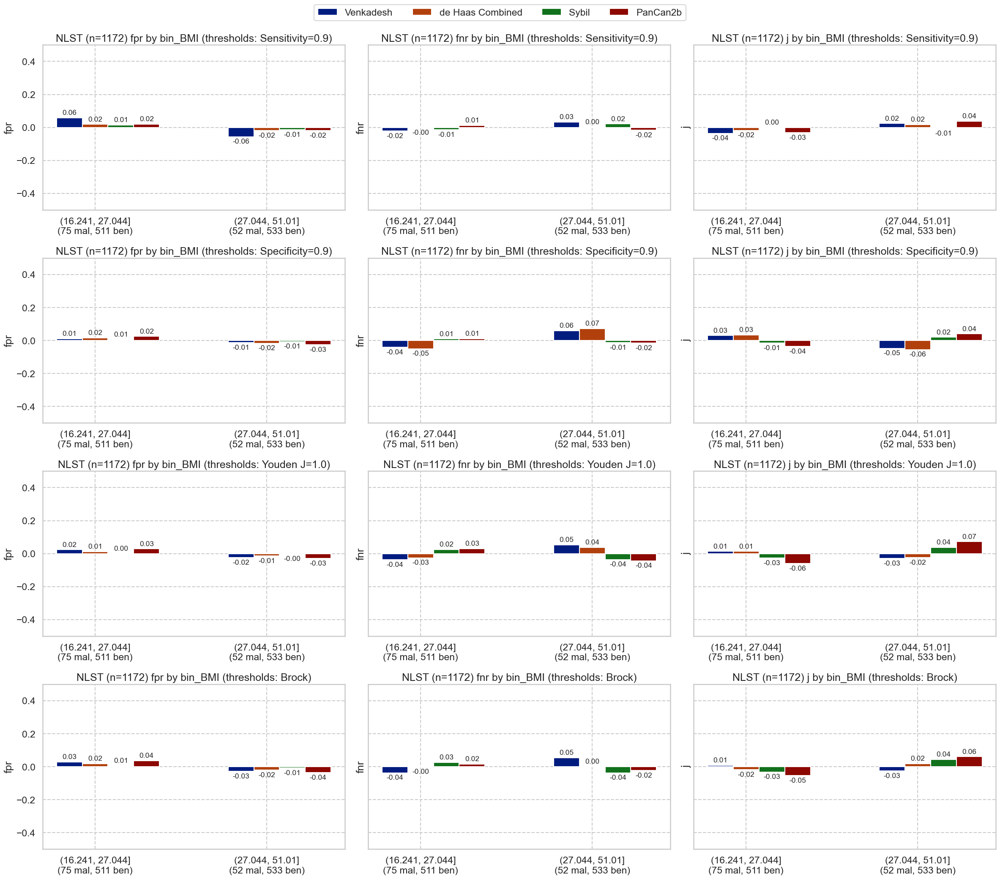

In [41]:
for c in nlst_democols['num']['demo']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

In [42]:
# nlst_preds['bin_height'] = pd.cut(nlst_preds['height'], bins=[48, 68, 88], right=True, labels=False)
# display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())
# plot_by_category(nlst_preds, f'bin_height')

In [43]:
# nlst_preds['bin_weight'] = pd.cut(nlst_preds['weight'], bins=[79, 179, 279], right=True, labels=False)
# display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())
# plot_by_category(nlst_preds, f'bin_weight')

### Smoking columns

#### pkyr

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,56.656603,22.031699,30.0,40.00,50.0,67.50,162.0
1,127.0,70.186220,29.608258,30.0,49.75,64.5,84.75,224.0


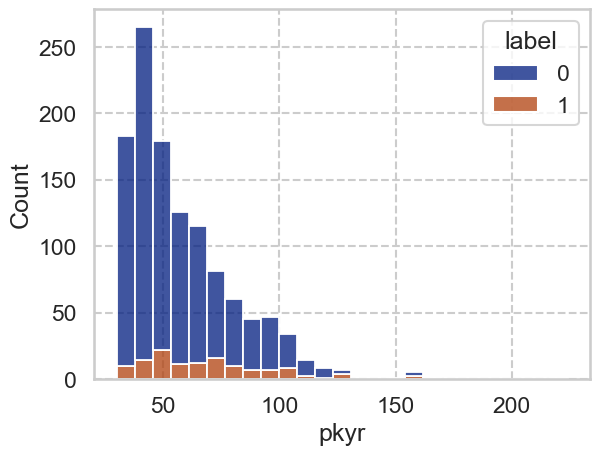

#### smokeage

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,16.448804,3.476042,5.0,14.0,16.0,18.0,40.0
1,127.0,16.220472,3.231574,8.0,14.0,16.0,18.0,26.0


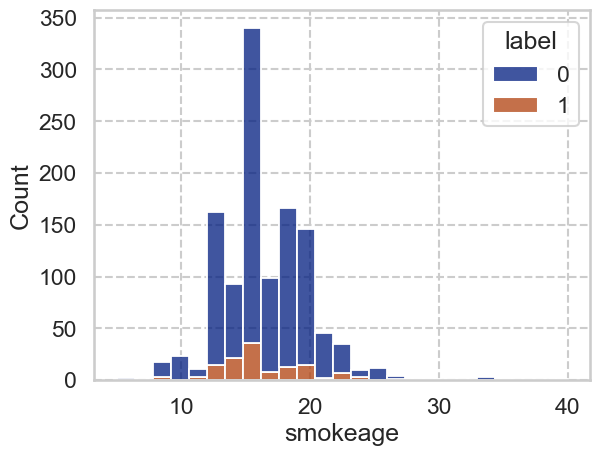

#### smokeday

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,28.328230,11.434740,12.0,20.0,25.0,32.0,80.0
1,127.0,31.818898,12.065573,18.0,20.0,30.0,40.0,80.0


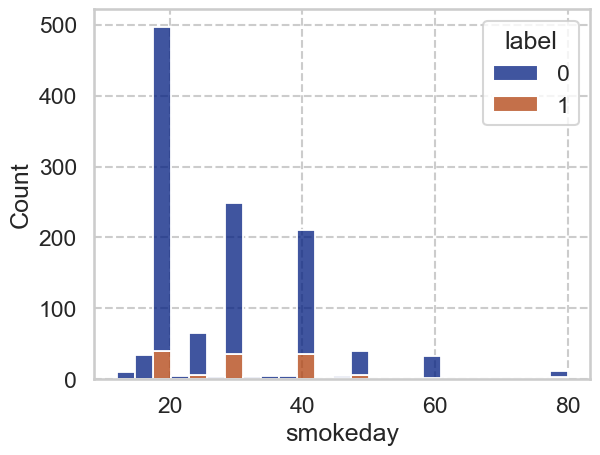

#### smokeyr

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,40.886124,7.696808,17.0,36.0,41.0,46.0,61.0
1,127.0,44.086614,7.219928,29.0,39.0,44.0,49.0,65.0


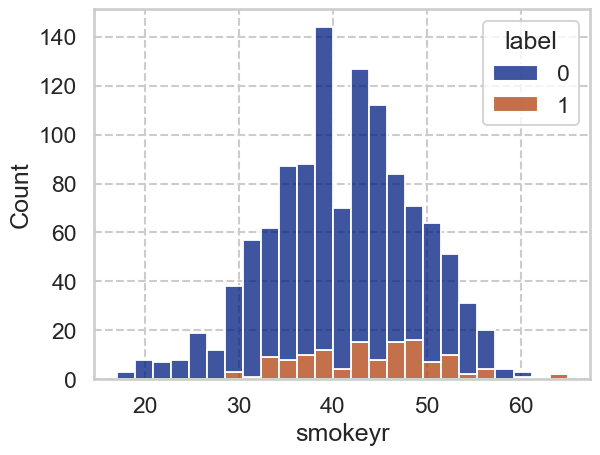

In [44]:
for c in nlst_democols['num']['smoke']:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

label                                                pkyr  \
          count      mean       std  min  25%  50%  75%  max  count   
bin_pkyr                                                              
0         601.0  0.063228  0.243575  0.0  0.0  0.0  0.0  1.0  601.0   
1         571.0  0.155867  0.363047  0.0  0.0  0.0  0.0  1.0  571.0   

                                                               
               mean        std   min   25%   50%   75%    max  
bin_pkyr                                                       
0         40.953411   6.072504  30.0  36.0  41.0  46.0   52.0  
1         76.194046  21.033603  52.5  60.0  70.0  88.0  224.0

### bin_pkyr

,num,pct,num_mal,pct_mal
0,601,51.279863,38,6.322795
1,571,48.720137,89,15.586690


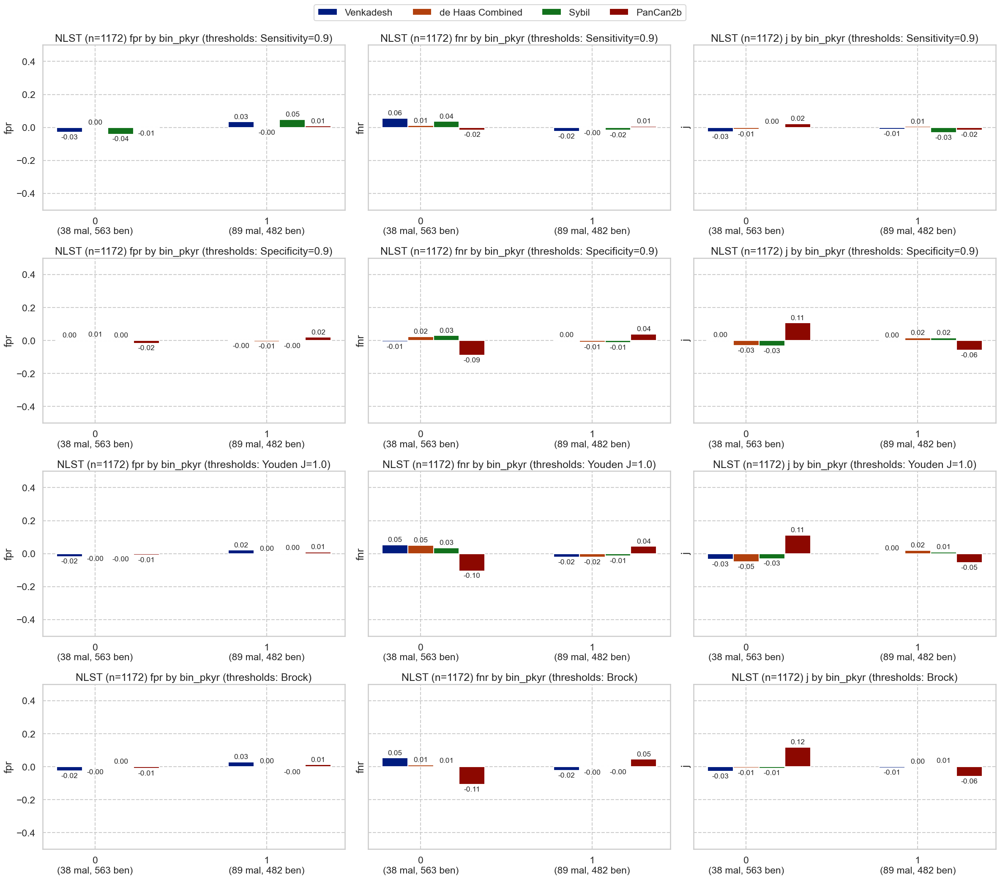

label                                              smokeage  \
              count      mean       std  min  25%  50%  75%  max    count   
bin_smokeage                                                                
0             648.0  0.120370  0.325646  0.0  0.0  0.0  0.0  1.0    648.0   
1             524.0  0.093511  0.291426  0.0  0.0  0.0  0.0  1.0    524.0   

                                                                 
                   mean       std   min   25%   50%   75%   max  
bin_smokeage                                                     
0             14.074074  1.907621   5.0  13.0  15.0  16.0  16.0  
1             19.330153  2.615545  17.0  18.0  18.0  20.0  40.0

### bin_smokeage

,num,pct,num_mal,pct_mal
0,648,55.290102,78,12.037037
1,524,44.709898,49,9.351145


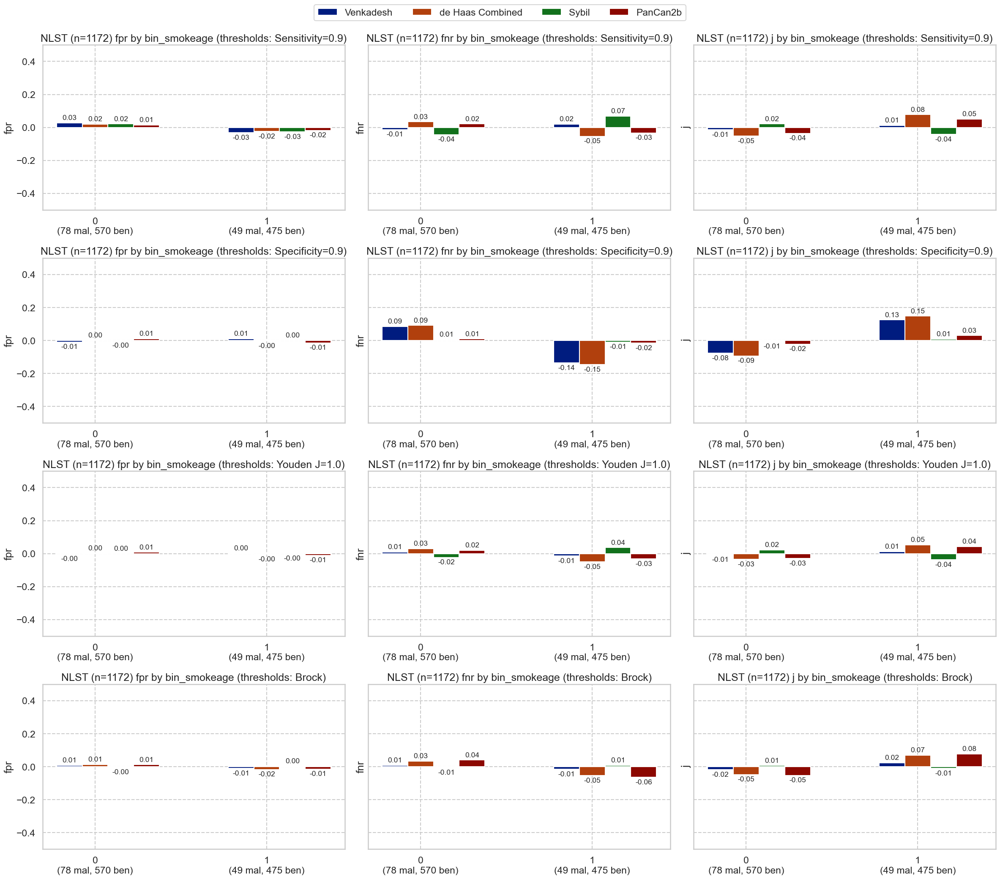

label                                              smokeday  \
              count      mean       std  min  25%  50%  75%  max    count   
bin_smokeday                                                                
0             611.0  0.075286  0.264069  0.0  0.0  0.0  0.0  1.0    611.0   
1             561.0  0.144385  0.351793  0.0  0.0  0.0  0.0  1.0    561.0   

                                                                  
                   mean        std   min   25%   50%   75%   max  
bin_smokeday                                                      
0             20.081833   2.207256  12.0  20.0  20.0  20.0  25.0  
1             38.099822  10.204027  28.0  30.0  40.0  40.0  80.0

### bin_smokeday

,num,pct,num_mal,pct_mal
0,611,52.133106,46,7.528642
1,561,47.866894,81,14.438503


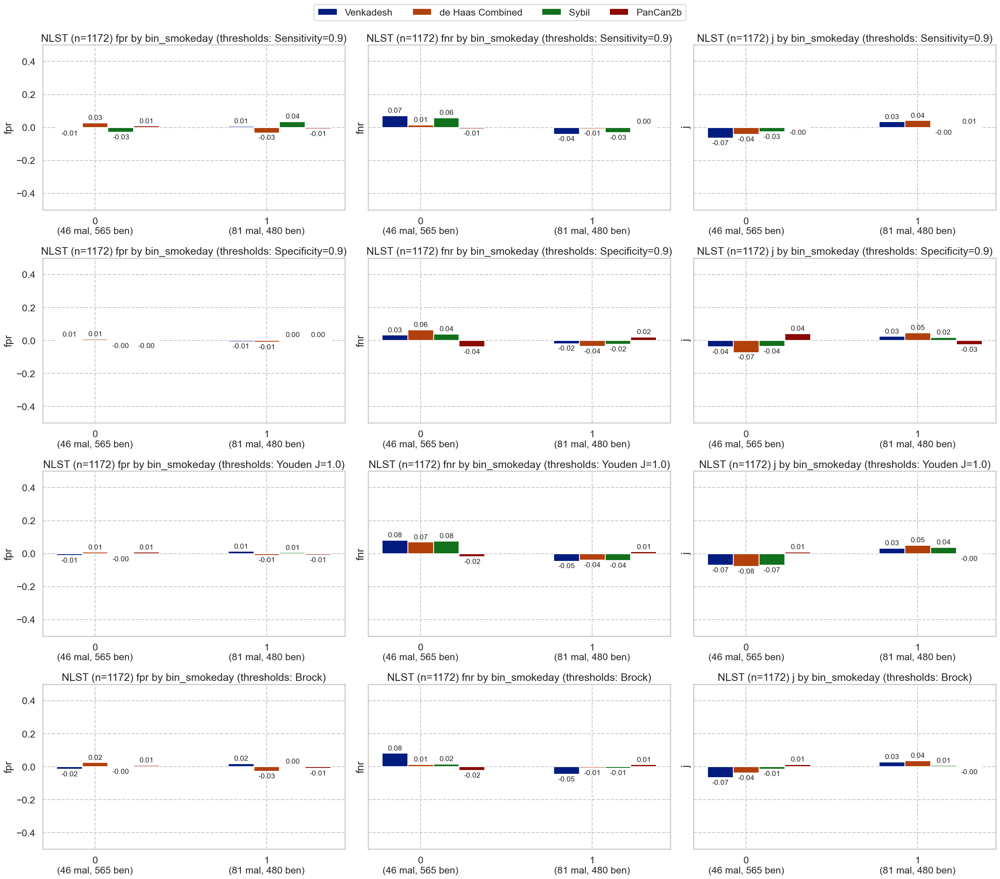

label                                              smokeyr  \
             count      mean       std  min  25%  50%  75%  max   count   
bin_smokeyr                                                               
0            603.0  0.077944  0.268305  0.0  0.0  0.0  0.0  1.0   603.0   
1            569.0  0.140598  0.347912  0.0  0.0  0.0  0.0  1.0   569.0   

                                                                
                  mean       std   min   25%   50%   75%   max  
bin_smokeyr                                                     
0            35.368159  5.119546  17.0  32.0  37.0  40.0  41.0  
1            47.448155  4.416024  42.0  44.0  46.0  50.0  65.0

### bin_smokeyr

,num,pct,num_mal,pct_mal
0,603,51.450512,47,7.794362
1,569,48.549488,80,14.059754


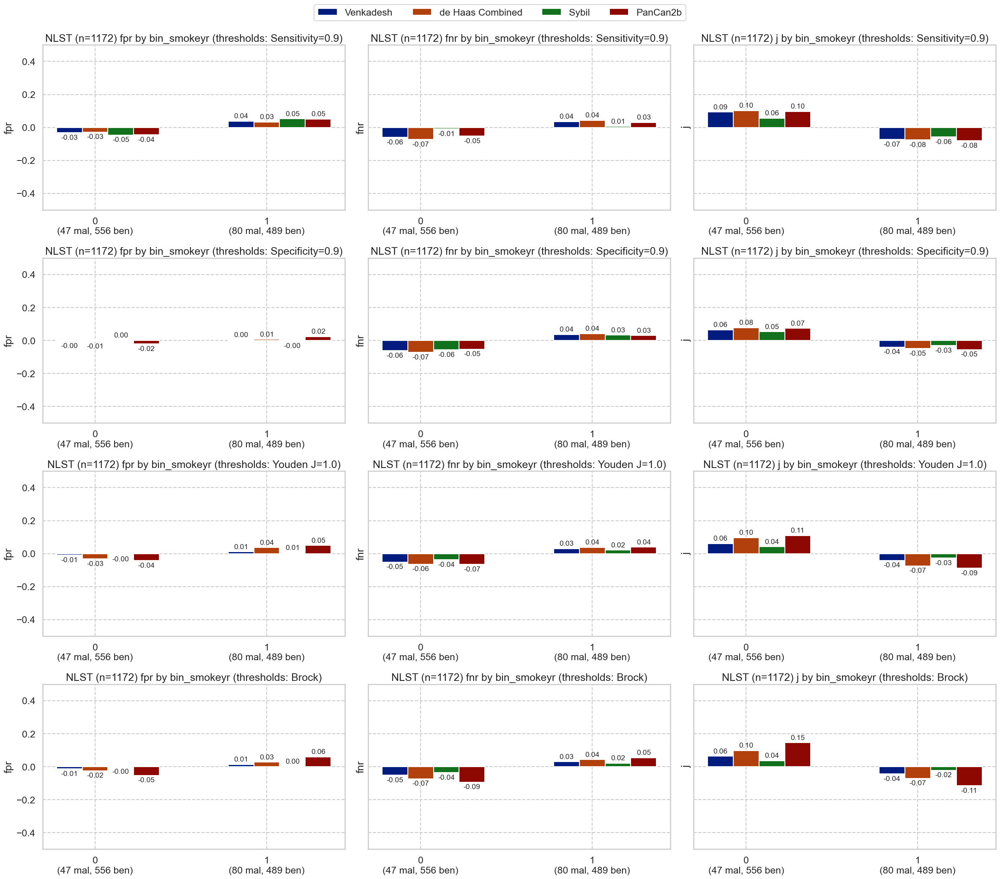

In [45]:
for c in nlst_democols['num']['smoke']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2, labels=False)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

### Included columns from predictions

#### Diameter [mm]

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,8.728517,5.254231,4.0,5.50,7.2,9.8,44.4
1,127.0,15.087402,11.924804,4.2,7.95,11.4,17.6,83.0


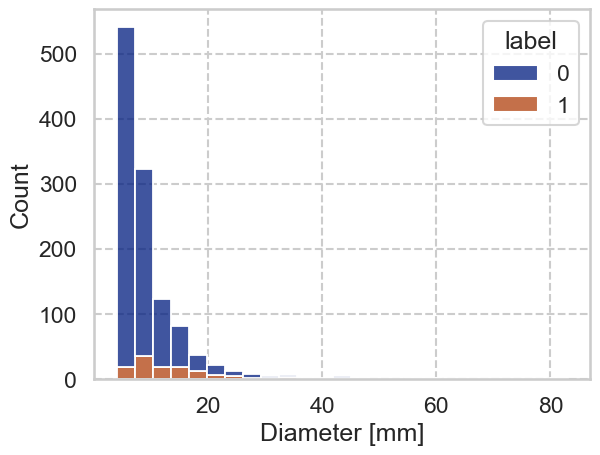

#### NoduleCounts

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,1.814354,1.255633,1.0,1.0,1.0,2.0,11.0
1,127.0,2.448819,1.541534,1.0,2.0,2.0,3.0,10.0


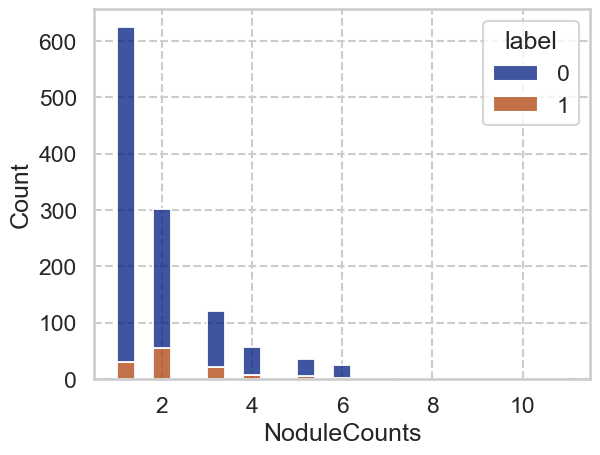

In [46]:
included_num_cols = ["Diameter [mm]", "NoduleCounts"]
for c in included_num_cols:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

label                                               \
                  count      mean       std  min  25%  50%  75%  max   
bin_NoduleCounts                                                       
0                 625.0  0.049600  0.217291  0.0  0.0  0.0  0.0  1.0   
1                 547.0  0.175503  0.380745  0.0  0.0  0.0  0.0  1.0   

                 NoduleCounts                                                
                        count      mean       std  min  25%  50%  75%   max  
bin_NoduleCounts                                                             
0                       625.0  1.000000  0.000000  1.0  1.0  1.0  1.0   1.0  
1                       547.0  2.892139  1.316725  2.0  2.0  2.0  3.0  11.0

### bin_NoduleCounts

,num,pct,num_mal,pct_mal
0,625,53.327645,31,4.960000
1,547,46.672355,96,17.550274


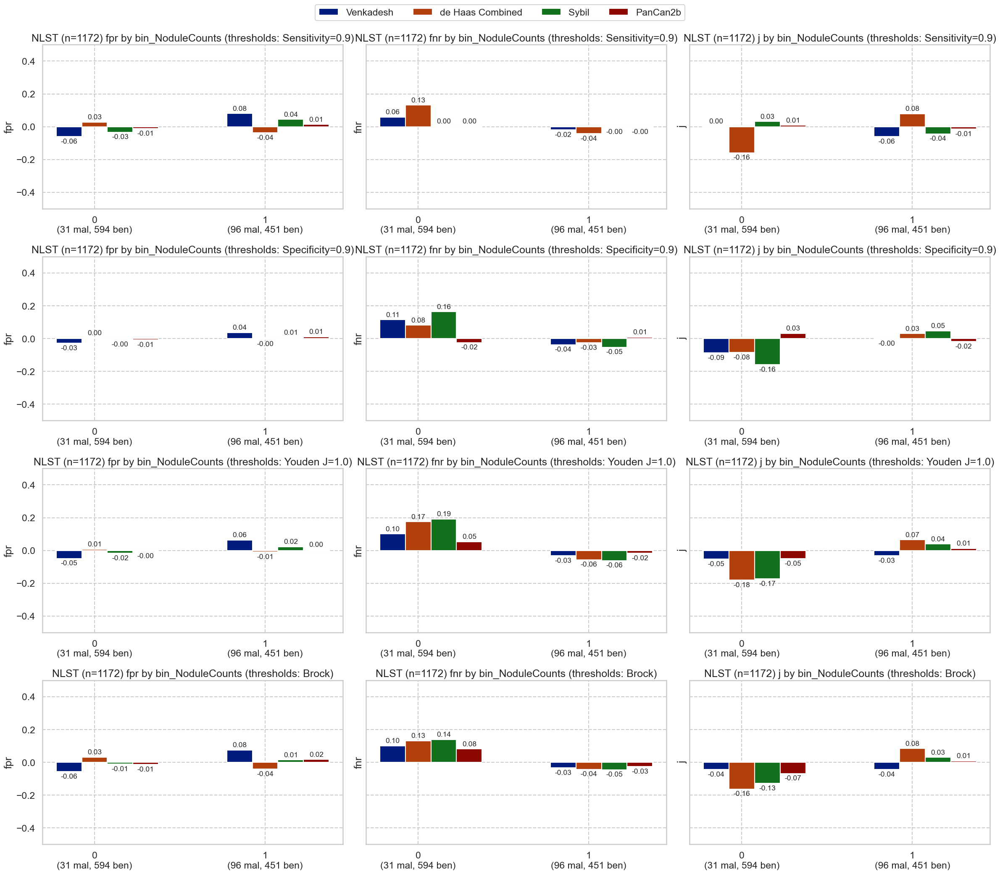

In [47]:
# for c in included_num_cols:
#     nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2, duplicates='drop')
#     display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
#     plot_by_category(nlst_preds, f'bin_{c}')
nlst_preds['bin_NoduleCounts'] = pd.cut(nlst_preds['NoduleCounts'], bins=[0, 1, 12], right=True, labels=False)
display(nlst_preds.groupby(f'bin_NoduleCounts')[['label', f'NoduleCounts']].describe())
plot_by_category(nlst_preds, f'bin_NoduleCounts')

label                                               \
                   count      mean       std  min  25%  50%  75%  max   
bin_Diameter [mm]                                                       
0                  598.0  0.045151  0.207808  0.0  0.0  0.0  0.0  1.0   
1                  574.0  0.174216  0.379626  0.0  0.0  0.0  0.0  1.0   

                  Diameter [mm]                                             \
                          count       mean       std  min  25%   50%   75%   
bin_Diameter [mm]                                                            
0                         598.0   5.679599  1.016325  4.0  4.8   5.7   6.5   
1                         574.0  13.311847  7.662230  7.6  8.8  10.9  14.9   

                         
                    max  
bin_Diameter [mm]        
0                   7.5  
1                  83.0

### bin_Diameter [mm]

,num,pct,num_mal,pct_mal
0,598,51.023891,27,4.515050
1,574,48.976109,100,17.421603


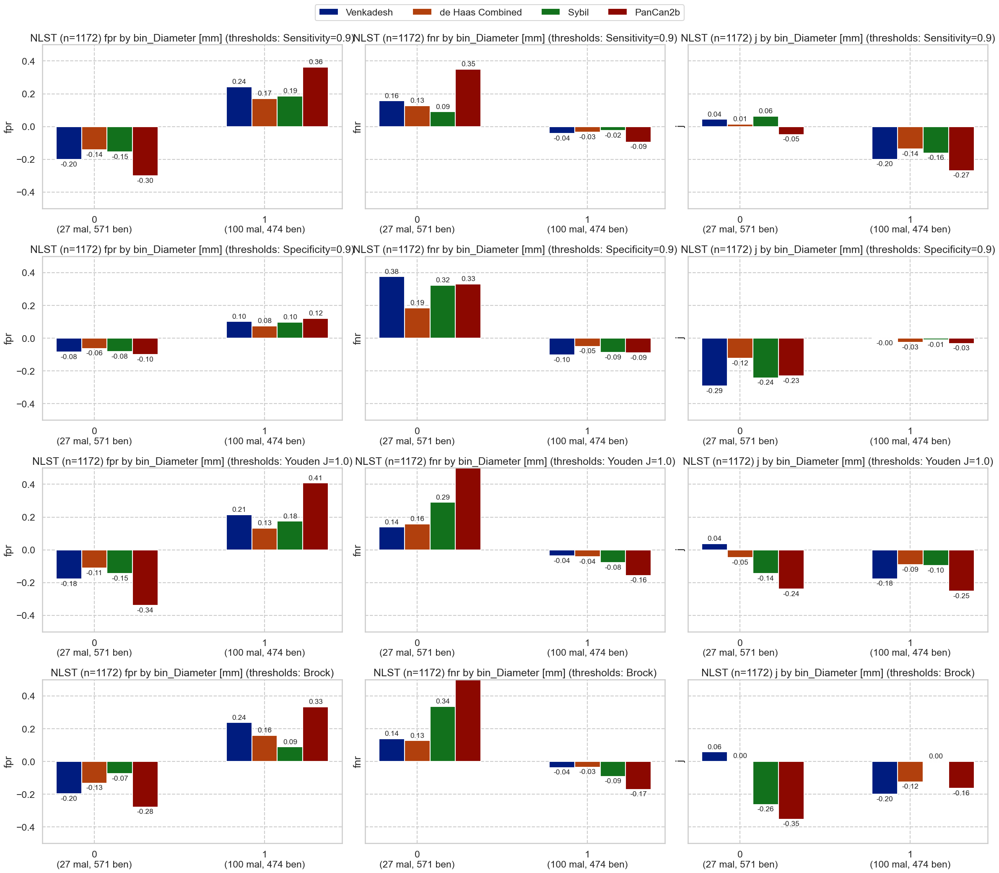

In [48]:
nlst_preds['bin_Diameter [mm]'] = pd.qcut(nlst_preds['Diameter [mm]'], q=2, labels=False)
display(nlst_preds.groupby(f'bin_Diameter [mm]')[['label', f'Diameter [mm]']].describe())
plot_by_category(nlst_preds, f'bin_Diameter [mm]')